In [33]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import matplotlib.pyplot as plt

from statsmodels.api import OLS
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
df_mix = pd.read_csv('/Users/dorianfitton/Library/Mobile Documents/com~apple~CloudDocs/Documents/Cours_Télécom/fil_rouge/fil_rouge.nosync/examples/datasets/eco2mix-national-cons-def.csv', sep=';')
print(df_mix['Date et Heure'])
df_mix['Date et Heure'] = pd.to_datetime(df_mix['Date et Heure'], utc=True)
df_mix = pd.read_csv('/Users/dorianfitton/Library/Mobile Documents/com~apple~CloudDocs/Documents/Cours_Télécom/fil_rouge/fil_rouge.nosync/examples/datasets/eco2mix-national-cons-def.csv', sep=';')
print(df_mix['Date et Heure'])
df_mix['Date et Heure'] = df_mix['Date et Heure'].apply(lambda x: x.tz_convert(None))
df_mix=df_mix.sort_values(by = 'Date et Heure').reset_index(drop=True)

# On met la colonne Date et Heure en dernière colonne 
cols = list(df_mix.columns.values)
cols.pop(cols.index('Date et Heure'))
df_mix = df_mix[cols+['Date et Heure']]
columns = df_mix.columns

df_mix = df_mix.set_index('Date et Heure')
df_mix.columns

FileNotFoundError: [Errno 2] No such file or directory: '/Users/dorianfitton/Library/Mobile Documents/com~apple~CloudDocs/Documents/Cours_Télécom/fil_rouge/fil_rouge.nosync/examples/datasets/eco2mix-national-cons-def.csv'

In [6]:
df_mix_ec = pd.read_csv('eCO2mix_RTE_En-cours-TR.csv', sep=';')
mask = df_mix_ec['Date'].isna()
df_mix_ec = df_mix_ec.loc[~mask]

df_mix_ec=df_mix_ec.drop([' Stockage batterie', 'DÈstockage batterie','Eolien terrestre', 'Eolien offshore'], axis=1)
df_mix_ec['Date_Heure_FR'] = df_mix_ec['Date'] + ' ' + df_mix_ec['Heures']
df_mix_ec['Date_Heure_FR'] = pd.to_datetime(df_mix_ec['Date_Heure_FR'], format = '%d/%m/%Y %H:%M')


/tmp/ipykernel_1433440/642984572.py:1: DtypeWarning: Columns (5,26,27) have mixed types. Specify dtype option on import or set low_memory=False.
  df_mix_ec = pd.read_csv('eCO2mix_RTE_En-cours-TR.csv', sep=';')


In [11]:
df_mix_ec.columns

Index(['PÈrimËtre', 'Nature', 'Date', 'Heures', 'Consommation',
       'PrÈvision J-1', 'PrÈvision J', 'Fioul', 'Charbon', 'Gaz', 'NuclÈaire',
       'Eolien', 'Solaire', 'Hydraulique', 'Pompage', 'BioÈnergies',
       'Ech. physiques', 'Taux de Co2', 'Ech. comm. Angleterre',
       'Ech. comm. Espagne', 'Ech. comm. Italie', 'Ech. comm. Suisse',
       'Ech. comm. Allemagne-Belgique', 'Fioul - TAC', 'Fioul - CogÈn.',
       'Fioul - Autres', 'Gaz - TAC', 'Gaz - CogÈn.', 'Gaz - CCG',
       'Gaz - Autres', 'Hydraulique - Fil de l?eau + ÈclusÈe',
       'Hydraulique - Lacs', 'Hydraulique - STEP turbinage',
       'BioÈnergies - DÈchets', 'BioÈnergies - Biomasse',
       'BioÈnergies - Biogaz', 'Date_Heure_FR'],
      dtype='object')

In [ ]:

df_mix_ec.columns = columns
# On transforme la colonne de date en UTC
heure_début_en_cours = df_mix_ec['Date et Heure'].loc[0]\
    .tz_localize('Europe/Paris')\
        .tz_convert('UTC')
time_index_ec = pd.date_range(heure_début_en_cours, periods=len(df_mix_ec), freq='15MIN') # en cours, 2021 - 2023
df_mix_ec['Date et Heure'] = time_index_ec.tz_localize(None)
df_mix_ec = df_mix_ec.set_index('Date et Heure')

In [7]:
df_cons_prod = pd.concat([df_mix, df_mix_ec], axis=0).sort_values('Date et Heure')
df_cons_prod = df_cons_prod.loc[::4, :] # On prend les données toutes le sheures 


In [20]:
df_cons_prod.loc['2022-12-31', 'Fioul (MW)':'Bioénergies (MW)'].sum(axis=1)

Date et Heure
2022-12-31 00:00:00    48186.0
2022-12-31 01:00:00    45924.0
2022-12-31 02:00:00    44734.0
2022-12-31 03:00:00    44291.0
2022-12-31 04:00:00    44403.0
2022-12-31 05:00:00    45682.0
2022-12-31 06:00:00    47516.0
2022-12-31 07:00:00    49146.0
2022-12-31 08:00:00    51166.0
2022-12-31 09:00:00    51880.0
2022-12-31 10:00:00    52824.0
2022-12-31 11:00:00    52167.0
2022-12-31 12:00:00    51234.0
2022-12-31 13:00:00    50875.0
2022-12-31 14:00:00    49733.0
2022-12-31 15:00:00    50135.0
2022-12-31 16:00:00    51761.0
2022-12-31 17:00:00    51905.0
2022-12-31 18:00:00    51264.0
2022-12-31 19:00:00    49626.0
2022-12-31 20:00:00    49077.0
2022-12-31 21:00:00    49831.0
2022-12-31 22:00:00    48036.0
2022-12-31 23:00:00    46263.0
dtype: float64

In [22]:
df_cons_prod.loc['2017-01-01', 'Consommation (MW)':'Taux de CO2 (g/kWh)']

,Consommation (MW),Prévision J-1 (MW),Prévision J (MW),Fioul (MW),Charbon (MW),Gaz (MW),Nucléaire (MW),Eolien (MW),Solaire (MW),Hydraulique (MW),Pompage (MW),Bioénergies (MW),Ech. physiques (MW),Taux de CO2 (g/kWh)
Date et Heure,,,,,,,,,,,,,,
2017-01-01 00:00:00,72912.0,73400,73400.0,596.0,1291.0,6593.0,53431.0,351.0,-1.0,5568.0,-197.0,1092.0,4189.0,74.0
2017-01-01 01:00:00,72166.0,73300,73300.0,599.0,1024.0,6548.0,53381.0,360.0,-1.0,5085.0,-50.0,1100.0,4121.0,71.0
2017-01-01 02:00:00,69709.0,69500,69700.0,629.0,993.0,6240.0,53010.0,340.0,-1.0,4581.0,-1194.0,1093.0,4019.0,72.0
2017-01-01 03:00:00,66476.0,66500,66500.0,400.0,937.0,5625.0,52940.0,376.0,-1.0,4312.0,-1356.0,1087.0,2156.0,66.0
2017-01-01 04:00:00,64321.0,64900,64700.0,179.0,1014.0,5676.0,53200.0,410.0,-1.0,3666.0,-1516.0,1097.0,595.0,66.0
2017-01-01 05:00:00,63983.0,64900,64300.0,215.0,1082.0,5754.0,53318.0,432.0,-1.0,3643.0,-1878.0,1094.0,325.0,68.0
2017-01-01 06:00:00,63830.0,65300,64600.0,184.0,1018.0,5671.0,53222.0,490.0,-1.0,3526.0,-1667.0,1091.0,297.0,66.0
2017-01-01 07:00:00,64178.0,66300,64900.0,175.0,1007.0,5641.0,53168.0,527.0,-1.0,3686.0,-1849.0,1091.0,734.0,66.0
2017-01-01 08:00:00,64383.0,66100,65200.0,175.0,1033.0,5734.0,53180.0,584.0,66.0,3742.0,-1777.0,1085.0,562.0,66.0


In [5]:
df_price = pd.read_csv('/Users/dorianfitton/Library/Mobile Documents/com~apple~CloudDocs/Documents/Cours_Télécom/fil_rouge/fil_rouge.nosync/examples/datasets/EPEX_FR 2.csv', sep=',')
df_price['Date'] = pd.to_datetime(df_price.Date.apply(lambda x: x[:-6])).dt.tz_localize(None)
df_price = df_price.set_index('Date', inplace=False)
df_price

,Load forecast,Generation forecast,Price
Date,,,
2017-01-01 00:00:00,73650.0,69539.0,58.23
2017-01-01 01:00:00,72350.0,67376.0,51.95
2017-01-01 02:00:00,68750.0,65412.0,47.27
2017-01-01 03:00:00,65900.0,64557.0,45.49
2017-01-01 04:00:00,65000.0,64552.0,44.50
...,...,...,...
2022-12-31 19:00:00,46950.0,44648.0,7.60
2022-12-31 20:00:00,44350.0,43841.0,3.69
2022-12-31 21:00:00,43950.0,44578.0,1.88


In [6]:
# Keep only the rows that have a consumption value
df_cons_prod = df_cons_prod[df_cons_prod['Consommation (MW)'] > 0]

<AxesSubplot:xlabel='Date et Heure'>

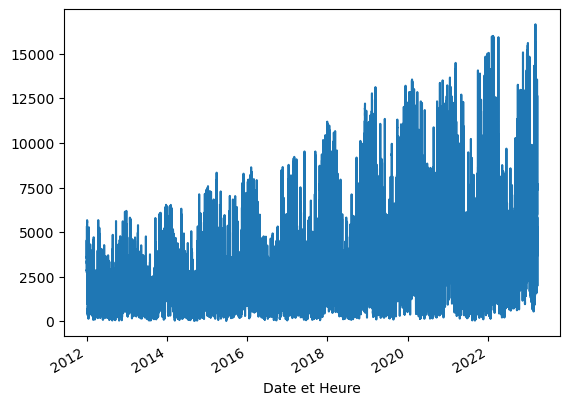

In [7]:
df_cons_prod['Eolien (MW)'].plot()

In [9]:
df_cons_prod['Renouvelables'] = df_cons_prod['Eolien (MW)'] + df_cons_prod['Solaire (MW)'] + df_cons_prod['Hydraulique (MW)']

common_index = df_cons_prod.index.intersection(df_price.index)

renouvelables = df_cons_prod['Renouvelables'].loc[common_index]
solaire = df_cons_prod['Solaire (MW)'].loc[common_index]
eolien = df_cons_prod['Eolien (MW)'].loc[common_index]
hydraulique = df_cons_prod['Hydraulique (MW)'].loc[common_index]
charbon = df_cons_prod['Charbon (MW)'].loc[common_index]
gaz = df_cons_prod['Gaz (MW)'].loc[common_index]
nucleaire = df_cons_prod['Nucléaire (MW)'].loc[common_index]
fioul = df_cons_prod['Fioul (MW)'].loc[common_index]


ex_phys = df_cons_prod['Ech. physiques (MW)'].loc[common_index]
ex_ang = df_cons_prod['Ech. comm. Angleterre (MW)'].loc[common_index]
ex_esp = df_cons_prod['Ech. comm. Espagne (MW)'].loc[common_index]
ex_ita = df_cons_prod['Ech. comm. Italie (MW)'].loc[common_index]
ex_sui = df_cons_prod['Ech. comm. Suisse (MW)'].loc[common_index]
ex_ger = df_cons_prod['Ech. comm. Allemagne-Belgique (MW)'].loc[common_index].astype('float64')
ex_sum = ex_phys + ex_ang + ex_esp + ex_ita + ex_sui + ex_ger
ex_sum = ex_sum.rename('Ech. Somme (MW)')


price = df_price['Price'].loc[common_index]



# concatenate price and features
df_all = pd.concat([price, charbon, gaz, nucleaire, renouvelables, solaire, eolien, hydraulique, ex_esp, ex_ang, ex_ger, ex_ita, ex_sui, ex_phys, ex_sum], axis=1)

df_all.tail()

,Price,Charbon (MW),Gaz (MW),Nucléaire (MW),Renouvelables,Solaire (MW),Eolien (MW),Hydraulique (MW),Ech. comm. Espagne (MW),Ech. comm. Angleterre (MW),Ech. comm. Allemagne-Belgique (MW),Ech. comm. Italie (MW),Ech. comm. Suisse (MW),Ech. physiques (MW),Ech. Somme (MW)
2022-12-31 19:00:00,7.60,43.0,2266.0,26445.0,22097.0,0.0,15597.0,6500.0,290.0,-3028.0,2074.0,-2453.0,-2758.0,-4922.0,-10797.0
2022-12-31 20:00:00,3.69,44.0,2327.0,26154.0,21935.0,0.0,15271.0,6664.0,1716.0,-3028.0,2540.0,-2401.0,-2873.0,-5571.0,-9617.0
2022-12-31 21:00:00,1.88,44.0,2273.0,25633.0,21898.0,0.0,14987.0,6911.0,258.0,-1430.0,3919.0,-2514.0,-2831.0,-3599.0,-6197.0
2022-12-31 22:00:00,0.10,45.0,2196.0,25262.0,21165.0,0.0,14620.0,6545.0,-3417.0,-2702.0,7196.0,-2514.0,-1770.0,-2220.0,-5427.0
2022-12-31 23:00:00,0.00,44.0,2247.0,25949.0,18945.0,0.0,12493.0,6452.0,-2913.0,-2530.0,9469.0,-2354.0,-1374.0,-1066.0,-768.0


In [10]:
df_all['Hydraulique (MW)'].shape

(52579,)

In [11]:
price_ar = np.array(price)
renouvelables_ar = np.array(renouvelables)
solaire_ar = np.array(solaire)
eolien_ar = np.array(eolien)
hydraulique_ar = np.array(hydraulique)
charbon_ar = np.array(charbon)
gaz_ar = np.array(gaz)
nucleaire_ar = np.array(nucleaire)

prince_ar_st = (price_ar-np.mean(price_ar))/np.std(price_ar)
renouvelables_ar_st = (renouvelables_ar-np.mean(renouvelables_ar))/np.std(renouvelables_ar)
solaire_ar_st = (solaire_ar-np.mean(solaire_ar))/np.std(solaire_ar)
eolien_ar_st = (eolien_ar-np.mean(eolien_ar))/np.std(eolien_ar)
hydraulique_ar_st = (hydraulique_ar-np.mean(hydraulique_ar))/np.std(hydraulique_ar)
charbon_ar_st = (charbon_ar-np.mean(charbon_ar))/np.std(charbon_ar)
gaz_ar_st = (gaz_ar-np.mean(gaz_ar))/np.std(gaz_ar)
nucleaire_ar_st = (nucleaire_ar-np.mean(nucleaire_ar))/np.std(nucleaire_ar)

price_ar_dif = np.diff(price_ar)
renouvelables_ar_dif = np.diff(renouvelables_ar)
solaire_ar_dif = np.diff(solaire_ar)
eolien_ar_dif = np.diff(eolien_ar)
hydraulique_ar_dif = np.diff(hydraulique_ar)
charbon_ar_dif = np.diff(charbon_ar)
gaz_ar_dif = np.diff(gaz_ar)
nucleaire_ar_dif = np.diff(nucleaire_ar)






# **Analyse du Prix de l'electricité**

Text(0.5, 1.0, "Dérivée première du prix de l'électricité au cours du temps")

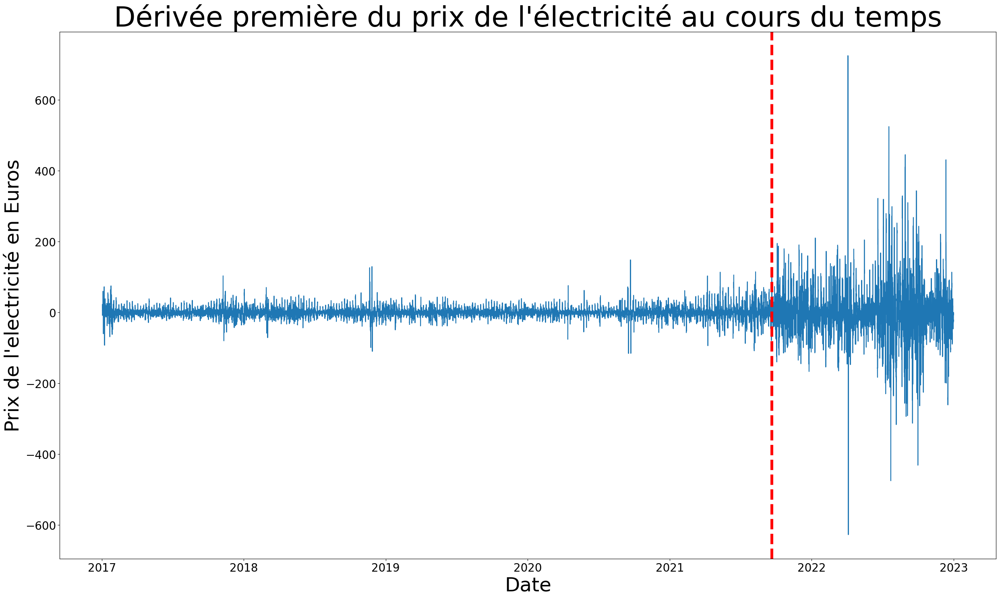

In [35]:
plt.figure(figsize=(30,17))
log_price = df_price['Price'].apply(lambda x: np.log(x))

# add a treshold that the serie df_price can not overcome (to avoid outliers)
treshold = 1000
df_price['Price'] = df_price['Price'].apply(lambda x: x if x < treshold else treshold)



plt.plot(df_price['Price'].diff(24))
plt.xlabel('Date', fontsize=35)
plt.ylabel('Prix de l\'electricité en Euros', fontsize=35)
plt.axvline(x=pd.to_datetime('2021-09-20'), color='r', linestyle='--', linewidth=5)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.title('Dérivée première du prix de l\'électricité au cours du temps', fontsize=50)



Text(0.5, 1.0, 'Distribution de probabilité du différentiel du prix normalisé')

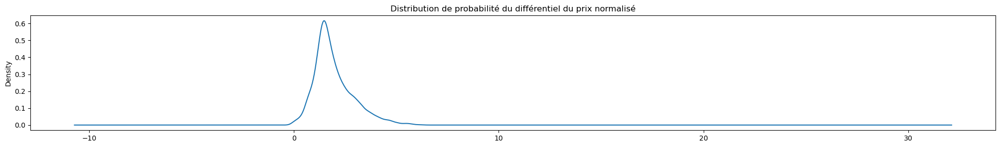

In [14]:
# distribution de probablilité du prix normalisé
plt.figure(figsize=(25,3))
(df_price['Price'].loc[pd.to_datetime("2021-11-01"):]/df_price['Price'].loc[pd.to_datetime("2021-11-01"):].std()).plot(kind='kde')
plt.title('Distribution de probabilité du différentiel du prix normalisé')


Text(0.5, 1.0, 'Distribution de probabilité du différentiel du prix normalisé')

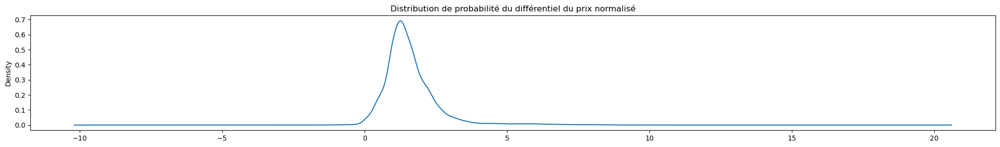

In [15]:
# distribution de probablilité du prix normalisé
plt.figure(figsize=(25,3))
(df_price['Price'].loc[:"2021-11-01"]/df_price['Price'].loc[:"2021-11-01"].std()).plot(kind='kde')
plt.title('Distribution de probabilité du différentiel du prix normalisé')

2022-12-31 19:00:00   -10.51
2022-12-31 20:00:00    -3.91
2022-12-31 21:00:00    -1.81
2022-12-31 22:00:00    -1.78
2022-12-31 23:00:00    -0.10
Name: Price, dtype: float64
Pour le prix: 
ADF Statistic: -37.486935
p-value: 0.000000
Used Lag: 58.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


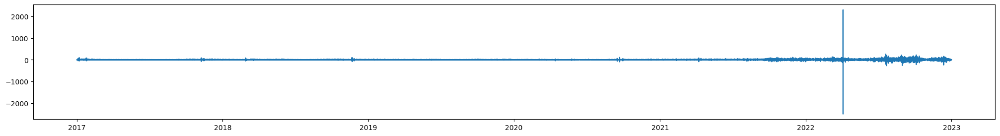

In [16]:
plt.figure(figsize=(25,3))
price_dif = price.diff().dropna()
plt.plot(price_dif)
print(price_dif.tail())
stat_test, p_value, usedlag, nobs, critical_values, icbest = adfuller(price_dif)
print('Pour le prix: ')
print('ADF Statistic: %f' % stat_test)
print('p-value: %f' % p_value)
print('Used Lag: %f' % usedlag)
print('Critical Values:')
for key, value in critical_values.items():
    print('\t%s: %.3f' % (key, value))

In [17]:
stat_test, p_value, nlags,critical_values = kpss(price_ar)
print('KPSS Statistic: %f' % stat_test)
print('p-value: %f' % p_value)
print('Critical Values:')
for key, value in critical_values.items():
    print('\t%s: %.3f' % (key, value))



KPSS Statistic: 17.486737
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739


/var/folders/h9/3f0fc1qs2t3943x127_ynxmc0000gn/T/ipykernel_8987/2844322275.py:1: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  stat_test, p_value, nlags,critical_values = kpss(price_ar)


Text(0.5, 1.0, 'Distribution de probabilité du différentiel du prix normalisé')

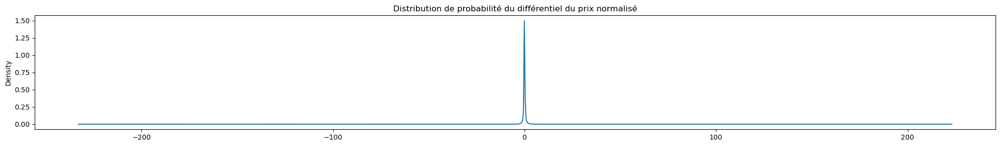

In [18]:
# distribution de probablilité du du différentiel du prix normalisé
plt.figure(figsize=(25,3))
(price_dif/price_dif.std()).plot(kind='kde')
plt.title('Distribution de probabilité du différentiel du prix normalisé')


In [19]:
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

pacf(price, nlags=70)

array([ 1.00000000e+00,  9.81937312e-01, -1.80058672e-01,  2.21438593e-01,
       -3.59994224e-02,  1.63686917e-01,  5.94681593e-02,  1.45591348e-01,
        1.00009923e-01,  1.54970811e-01,  1.11948079e-01,  6.78880262e-02,
        4.19157063e-03, -4.89621304e-02, -1.99937694e-02,  9.27845913e-04,
        4.54804762e-02,  5.94396316e-02,  8.69020141e-02,  9.73488449e-02,
        1.13881056e-01,  1.51601680e-01,  1.48860568e-01,  1.15829013e-01,
        1.33138769e-03, -1.43249159e-01, -1.07643398e-01, -9.72938846e-02,
       -4.69824728e-02, -3.52165299e-02, -2.72175476e-02, -3.48702917e-03,
       -1.84147352e-02,  1.84823353e-02,  1.84961649e-02,  4.10713258e-02,
        4.25379895e-03, -2.33651182e-03, -1.70135410e-02,  7.56644427e-03,
        1.33606668e-03,  1.49390266e-02, -2.99102349e-03,  2.60773421e-02,
        2.81965053e-02,  6.08634771e-02,  5.83807779e-02,  6.34682269e-02,
        4.90920121e-03, -7.85941600e-02, -3.23950912e-02, -4.04476002e-02,
       -1.98875552e-05,  

In [297]:
from statsmodels.tsa.ar_model import AutoReg
aic=[]
bic=[]
for i in range(24*30,24*35):
    print(i)
    model = AutoReg(price, lags=i).fit()
    aic.append(model.aic)
    bic.append(model.bic)
print('min AIC lag: ', np.argmin(aic))
print('min BIC lag: ',np.argmin(bic))


/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provide

KeyboardInterrupt: 

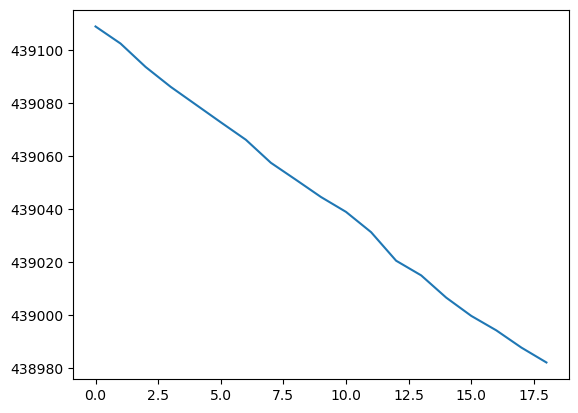

In [298]:
plt.plot(aic)

# **Analyse de la production d'énergies renouvelables**

Text(0.5, 1.0, 'Variance glissante (30 jours) des échanges France / Allemagne-Belgique')

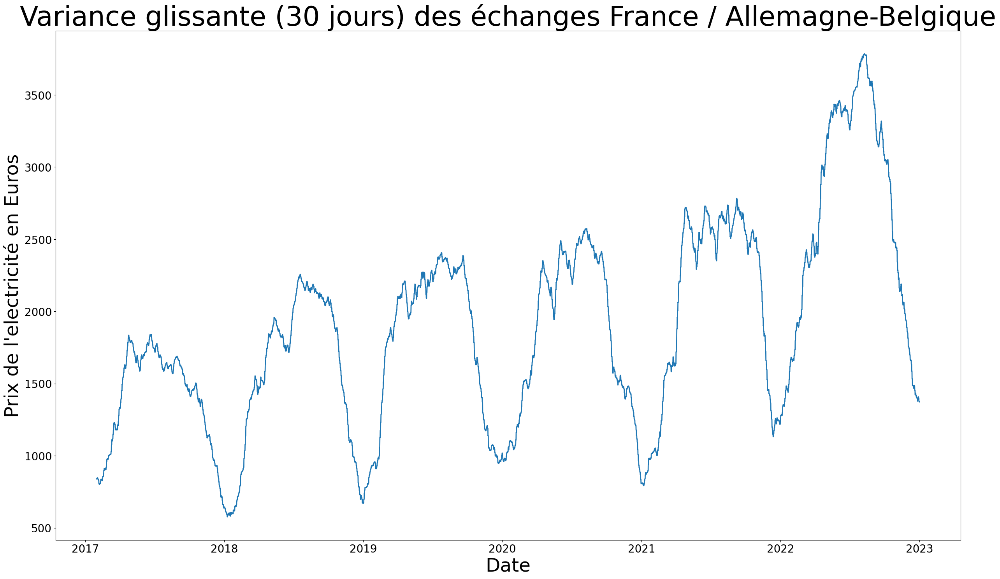

In [57]:
plt.figure(figsize=(30,17))

plt.plot(solaire.rolling(24*30).std(), label='Variance glissante', linewidth=2)

plt.xlabel('Date', fontsize=35)
plt.ylabel('Prix de l\'electricité en Euros', fontsize=35)
#plt.axvline(x=pd.to_datetime('2021-09-20'), color='r', linestyle='--', linewidth=5)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.title('Variance glissante (30 jours) des échanges France / Allemagne-Belgique', fontsize=50)

1. Décomposition de saisonnalité multiple à la main 

<AxesSubplot:ylabel='Density'>

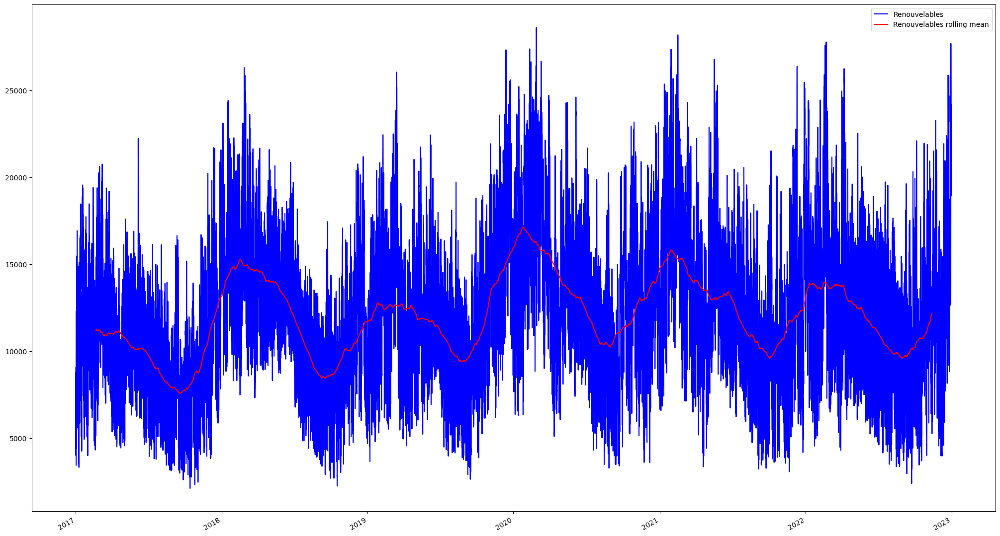

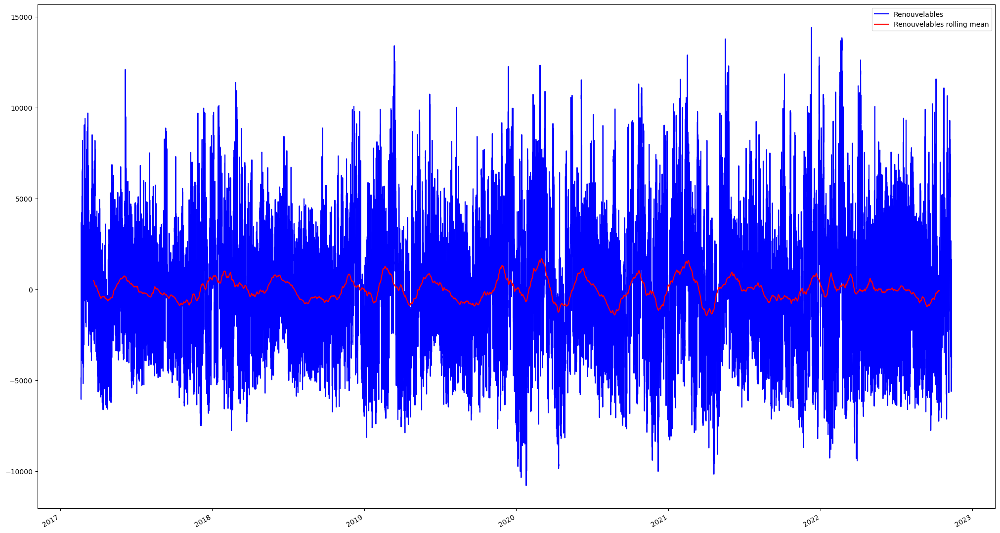

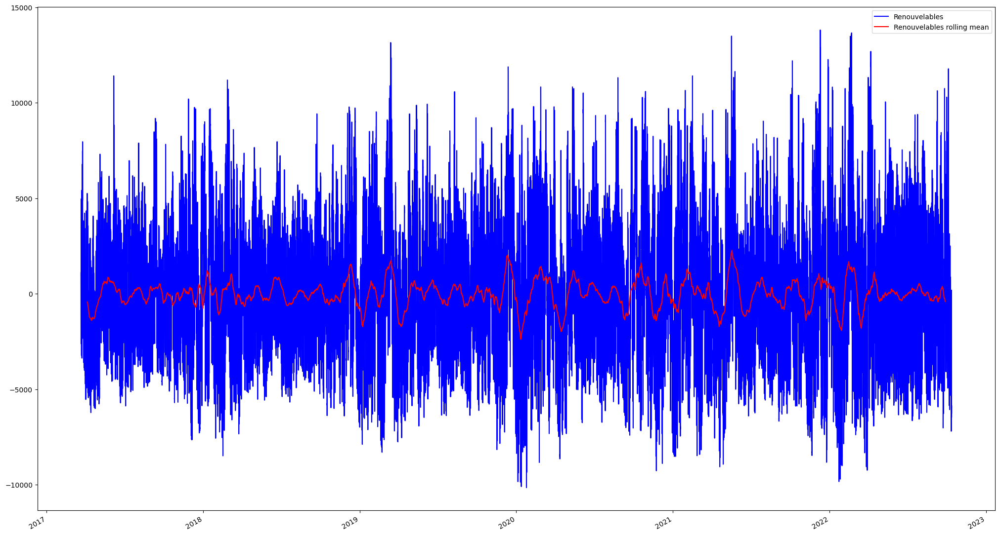

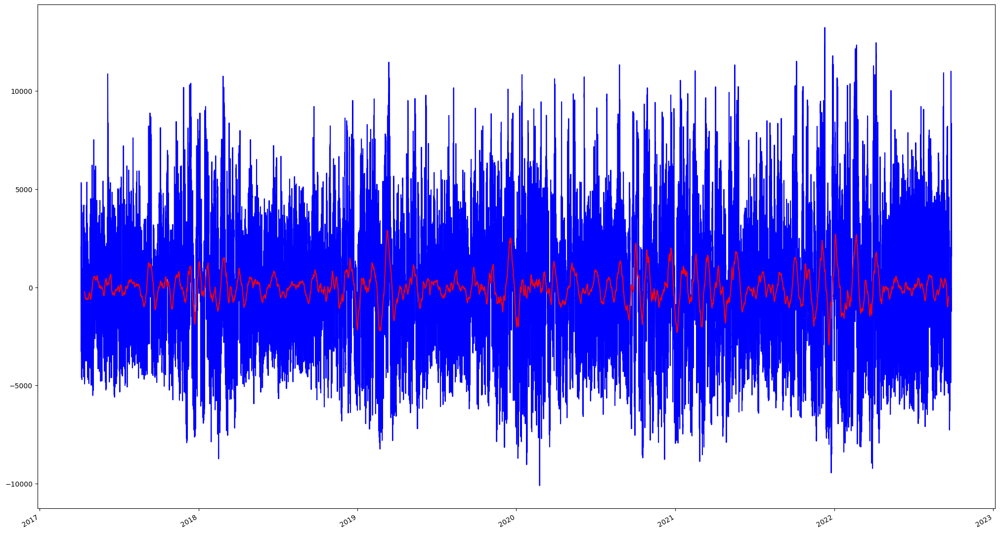

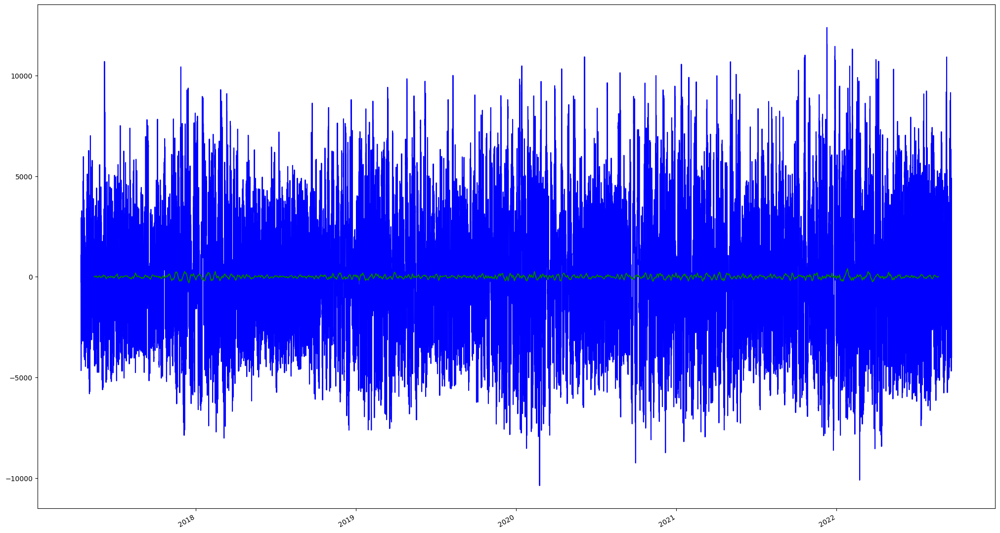

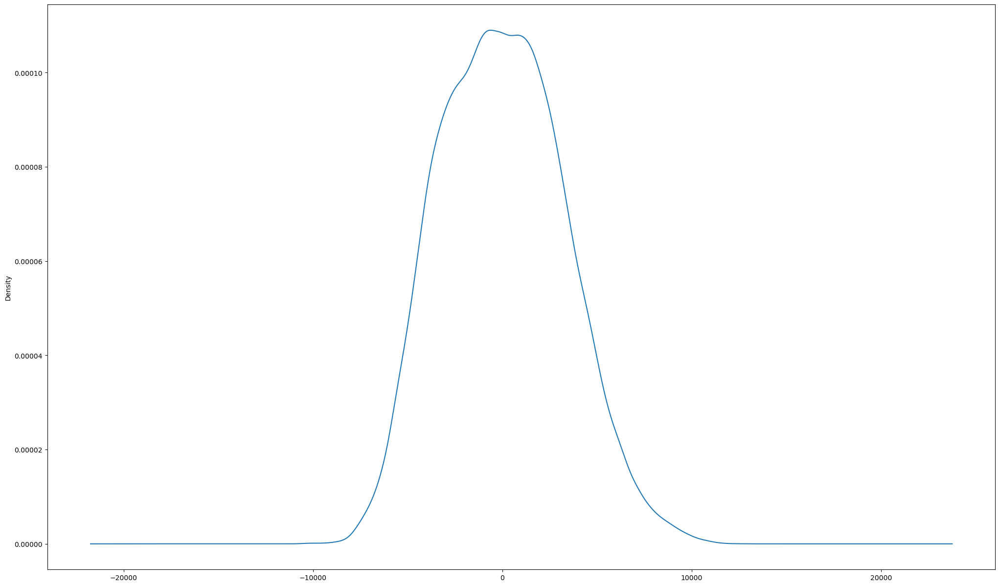

In [20]:
# Décompositoin de la série temporelle à la main

plt.figure(figsize=(25,15))
renouvelables.plot(color='blue')
renouvelables.rolling(24*100).mean().shift(-24*50).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_renew = renouvelables - renouvelables.rolling(24*100).mean().shift(-24*50)
mean_remove_renew.plot(color='blue')
mean_remove_renew.rolling(24*60).mean().shift(-24*30).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_renew_2 = mean_remove_renew - mean_remove_renew.rolling(24*60).mean().shift(-24*30)
mean_remove_renew_2.plot(color='blue')
mean_remove_renew_2.rolling(24*30).mean().shift(-24*15).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_renew_3 = mean_remove_renew_2 - mean_remove_renew_2.rolling(24*30).mean().shift(-24*15)
mean_remove_renew_3.plot(color='blue')
mean_remove_renew_3.rolling(24*15).mean().shift(-24*7).plot(color='red')

plt.figure(figsize=(25,15))
mean_remove_renew_4 = mean_remove_renew_3 - mean_remove_renew_3.rolling(24*15).mean().shift(-24*7)
mean_remove_renew_4.plot(color='blue')
#mean_remove_renew_4.loc['2017':'2020'].rolling(24*7).mean().shift(-24*3).plot(color='red')
mean_remove_renew_4.rolling(24*60).mean().shift(-24*30).plot(color='green')


plt.figure(figsize=(25,15))
mean_remove_renew_4.plot(kind = 'kde')


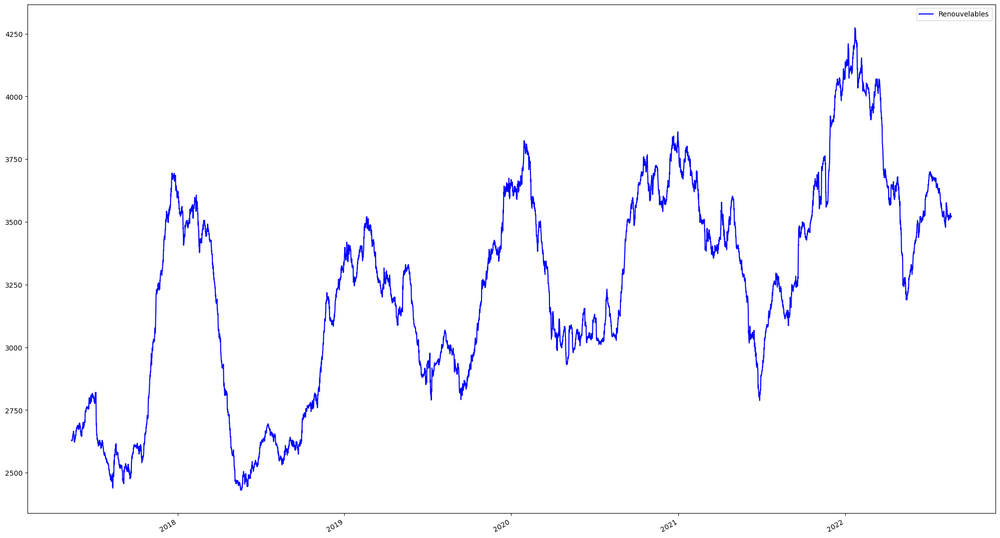

In [21]:
# ON calcule la saisonnalité de la variance mobile 
plt.figure(figsize=(25,15))
mean_remove_renew_4.rolling(24*60).std().shift(-24*30).plot(color='blue')
plt.legend(['Renouvelables', 'Renouvelables rolling std'])



On remarque une saisonnalité dans la variance. Il y a plus de variance en hiver qu'en été. Peut-être peut-on ajouter la température dans le modèlé? 


In [22]:
plt.figure(figsize=(35,15))
price_dif = price.diff(24)
price_dif_pos = price_dif + abs(price_dif.min()) + 0.01

price_log_dif = np.log(price_dif_pos)
print(type(price_log_dif))


<class 'pandas.core.series.Series'>


<Figure size 3500x1500 with 0 Axes>

In [29]:
price_log_dif.iloc[price_log_dif.argmin()] = price_log_dif.iloc[price_log_dif.argmin()-1]

In [30]:
price_log_dif.iloc[price_log_dif.argmax()] = price_log_dif.iloc[price_log_dif.argmax()-1]

std 2017:  0.012824729048278357


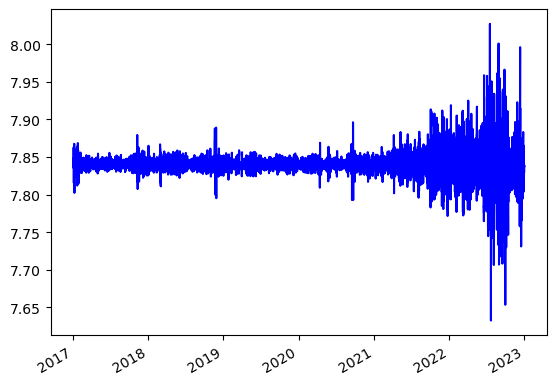

In [31]:
price_log_dif.plot(color='blue')
print('std 2017: ', price_log_dif.dropna().std())

Text(0.5, 1.0, "Variance mobile du prix de l'électricité")

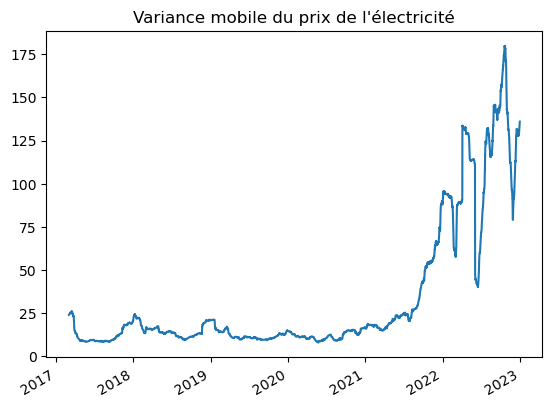

In [32]:
price.rolling(24*60).std().plot()
plt.title('Variance mobile du prix de l\'électricité')

In [ ]:
# On a une variance qui varie au cours du temps, on est dans un cas hétéroscédastique. Il faut donc utiliser des modèles GARCH pour estimer la variance.


Si vous choisissez d'utiliser un modèle GARCH pour modéliser la variance de vos variables exogènes, vous pouvez suivre les étapes suivantes :

Estimer le modèle GARCH : Pour modéliser la variance de la variable exogène, vous pouvez estimer un modèle GARCH approprié. Le modèle GARCH estime un modèle ARMA pour les résidus et un modèle GARCH pour la variance des résidus. Les paramètres du modèle GARCH sont généralement estimés à l'aide de la méthode du maximum de vraisemblance.

Obtenir les résidus : Après avoir estimé le modèle GARCH, vous pouvez obtenir les résidus en utilisant les données observées et les paramètres estimés du modèle. Les résidus sont calculés en soustrayant la valeur prédite de la variable exogène (en utilisant le modèle ARMA) de la valeur observée.

Tester la causalité : Une fois que vous avez obtenu les résidus, vous pouvez tester la causalité entre la variable exogène et la variable endogène en utilisant des méthodes standard de test de causalité, telles que le test de Granger. Le test de Granger évalue si l'inclusion des résidus de la variable exogène améliore la prédiction de la variable endogène par rapport à un modèle qui n'inclut pas les résidus.

Interpréter les résultats : Si le test de Granger montre une relation causale significative entre la variable exogène et la variable endogène, cela suggère qu'il y a une influence de la variable exogène sur la variable endogène. Vous pouvez interpréter les coefficients de régression pour évaluer la force et la direction de cette relation.

In [404]:
import armagarch as ag

model = ag.garch(order = {'p':1,'q':1})





SystemError: initialization of _internal failed without raising an exception

2. Décomposition de saisonnalité simple avec statsmodels

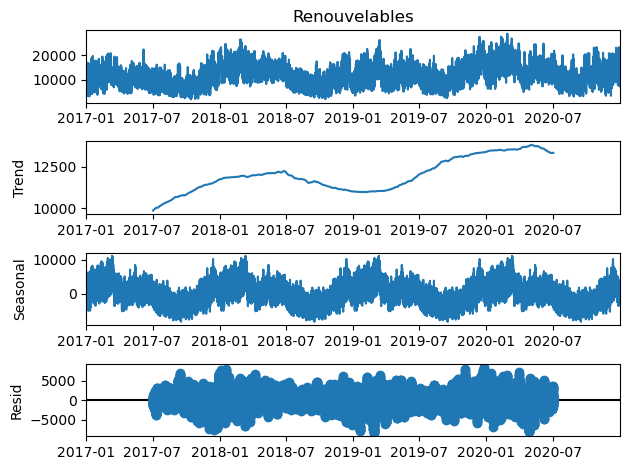

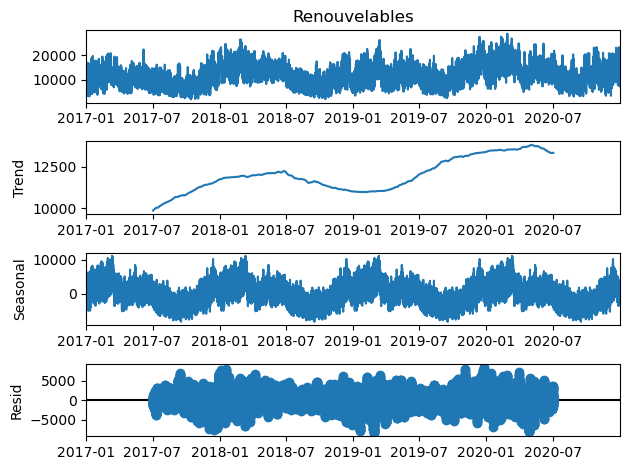

In [34]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Test de décomposition de Time Series avec saisonnalité simple

analysis = renouvelables.loc['2017':'2020'].copy()


decompose_result_mult = seasonal_decompose(analysis, model="additive", period=(24*365))

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

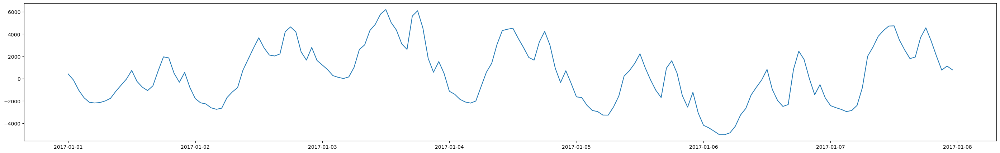

In [36]:
# Zoom sur la saisonnalité journalière
plt.figure(figsize=(35,5))
plt.plot(seasonal.loc['2017-01-01':'2017-01-07'])

3. Décomposition de saisonnalité multiple avec statsmodels

In [260]:
from statsmodels.tsa.seasonal import MSTL
# Décomposition avec multi-saisonnalité

model_ren = MSTL(renouvelables, periods=(24, 24*365))
res_ren = model_ren.fit()
resid_ren = res_ren.resid


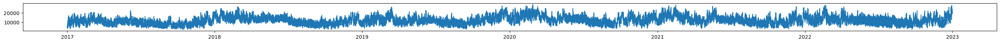

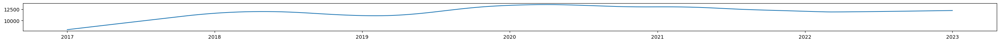

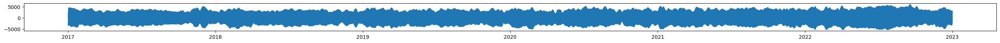

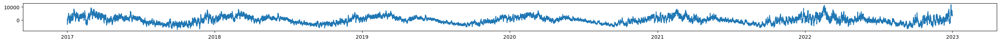

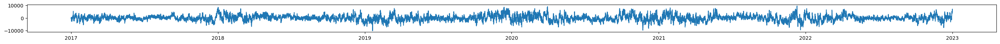

In [272]:
plt.figure(figsize=(35,1))
plt.plot(renouvelables)
plt.figure(figsize=(35,1))
plt.plot(res_ren.trend)
plt.figure(figsize=(35,1))
plt.plot(res_ren.seasonal.seasonal_24)
plt.figure(figsize=(35,1))
plt.plot(res_ren.seasonal.seasonal_8760)
plt.figure(figsize=(35,1))
plt.plot(res_ren.resid)

Text(0.5, 1.0, 'Distribution de probabilité du résidu')

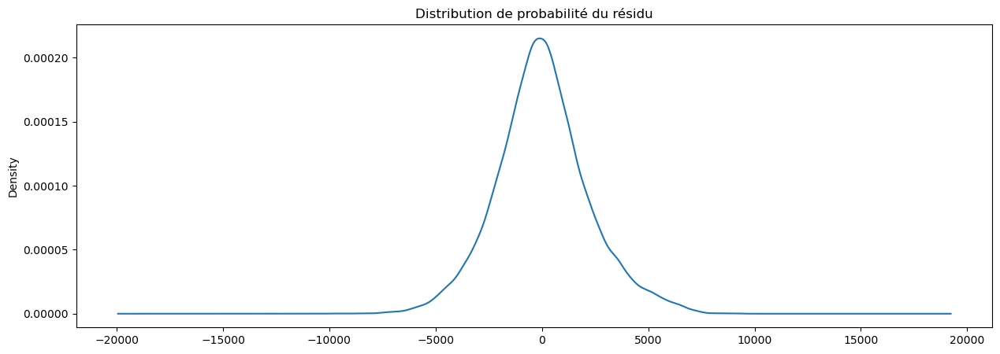

In [262]:
plt.figure(figsize=(15,5))
res_ren.resid.plot(kind='kde')
plt.title('Distribution de probabilité du résidu')

<class 'pandas.core.series.Series'>
Pour le prix: 
ADF Statistic: -16.289063
p-value: 0.000000
Used Lag: 58.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


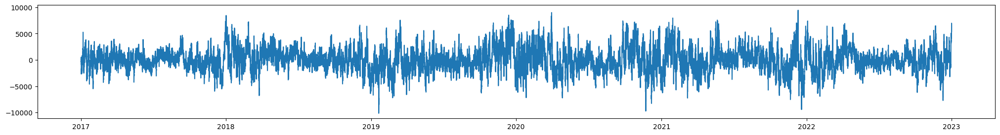

In [264]:
window = 24
deseasonned_renew = resid.dropna()# - renouvelables.shift(24)).dropna()
print(type(deseasonned_renew))
plt.figure(figsize=(25,3))
plt.plot(deseasonned_renew)
stat_test, p_value, usedlag, nobs, critical_values, icbest = adfuller(deseasonned_renew)
print('Pour le prix: ')
print('ADF Statistic: %f' % stat_test)
print('p-value: %f' % p_value)
print('Used Lag: %f' % usedlag)
print('Critical Values:')
for key, value in critical_values.items():
    print('\t%s: %.3f' % (key, value))

3. 2. Décomposition des énergies renouvelables une par une 

3. 2. 1. Solaire

<AxesSubplot:>

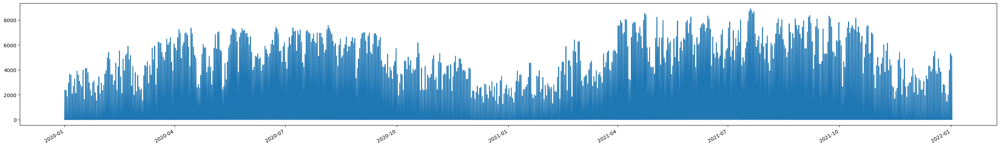

In [40]:
solaire.loc['2020-01-01':'2022-01-01'].plot(figsize=(35,5))

<AxesSubplot:>

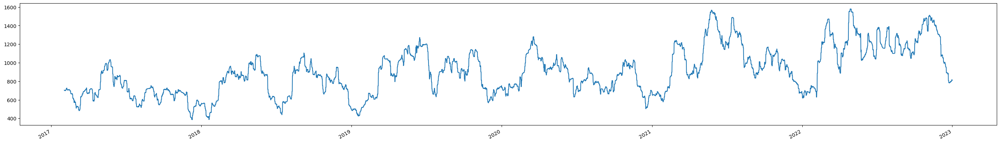

In [126]:
solaire.diff(24).diff(24).rolling(24*30).std().plot(figsize=(35,5))

In [59]:
model_sol = MSTL(solaire, periods=(24, 24*365))
res_sol = model_sol.fit()
resid_sol = res_sol.resid

Text(0.5, 1.0, "Résidu de la production d'énergie solaire (en MW) en France au cours du temps")

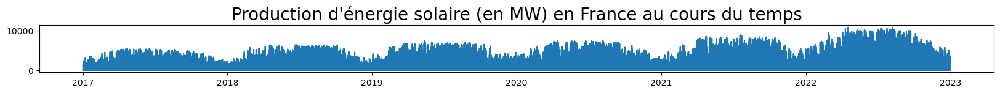

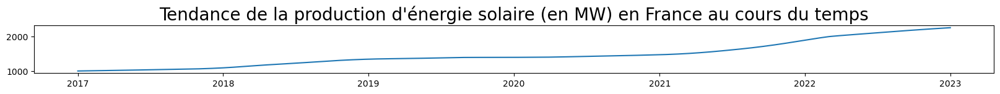

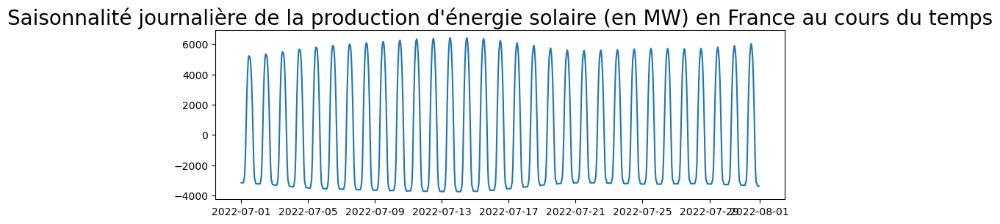

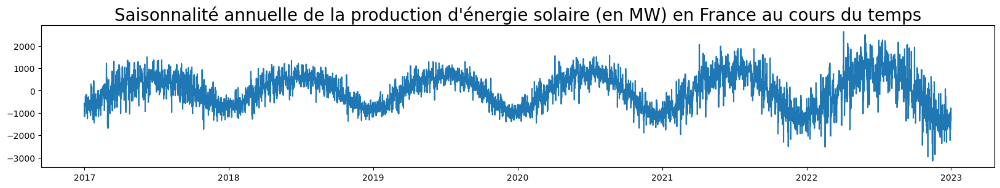

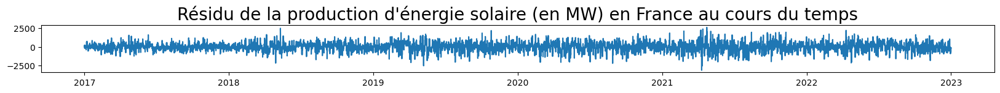

In [78]:
plt.figure(figsize=(20,1))
plt.plot(solaire)
plt.title('Production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,1))
plt.plot(res_sol.trend)
plt.title('Tendance de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(10,3))
plt.plot(res_sol.seasonal.seasonal_24.loc['2022-07'])
plt.title('Saisonnalité journalière de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,3))
plt.plot(res_sol.seasonal.seasonal_8760)
plt.title('Saisonnalité annuelle de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,1))
plt.plot(res_sol.resid)
plt.title('Résidu de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)

<AxesSubplot:ylabel='Density'>

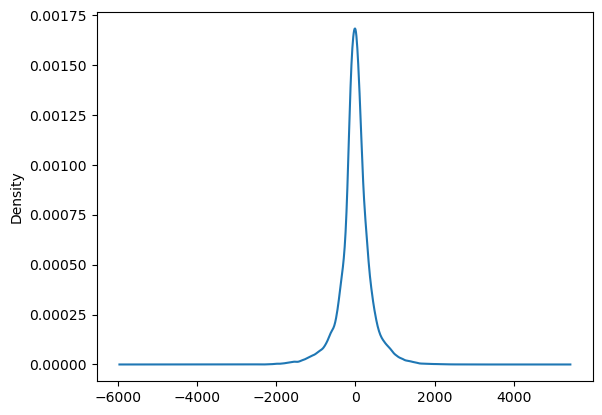

In [79]:
res_sol.resid.plot(kind='kde')

<AxesSubplot:>

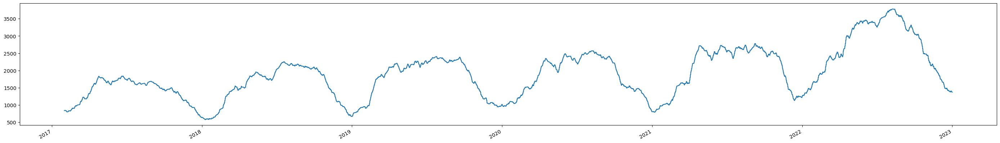

In [57]:
solaire.rolling(30*24).std().plot(figsize=(35,5))

[23. 23. 23. ... 24. 24. 24.]
[3.18516866 3.18516866 3.18516866 ... 3.22909321 3.22909321 3.22909321]


/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


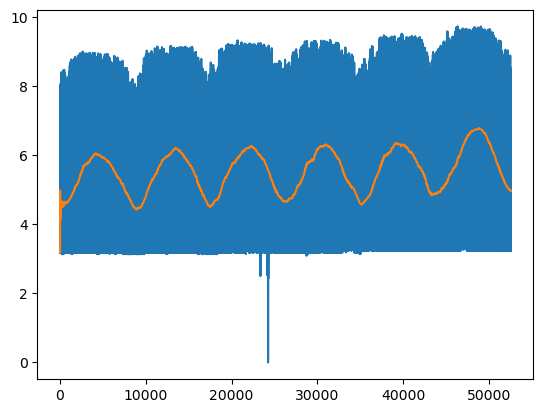

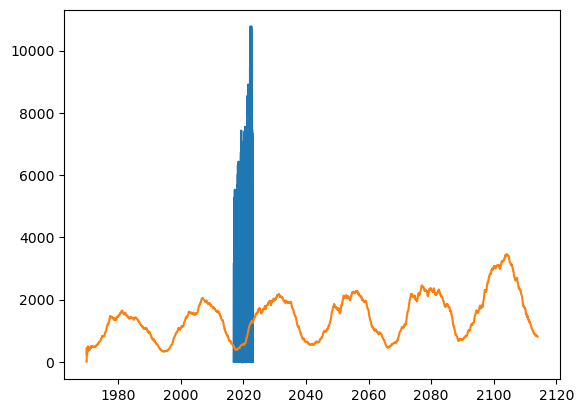

In [124]:
# create a functoin that box-code transform a solaire_bcframe with a condition if price is negative
import scipy.stats as stats
# trouve moi la valeur de lambda pour le df gaz
def box_cox(df):
    if df.min() < 0:
        return stats.boxcox(df, lmbda=0.5)[0]
    else:
        return stats.boxcox(df, lmbda=0)[0]
solaire_pos =  solaire + abs(solaire.min()) + 1 
solair_pos = np.array(solaire_pos)
print(solair_pos)
solaire_bc = stats.boxcox(solaire_pos, lmbda=0.01 )
print(solaire_bc)
plt.plot(solaire_bc)

# créer une fonction qui permet de créer une moyenne roulante sur un array
def rolling_mean(array, window):

    # create an empty array to store the rolling mean
    rolling_mean = np.zeros(len(array))

    # fill the array with the rolling mean
    for i in range(len(array)):
        if i < window:
            rolling_mean[i] = np.mean(array[:i])
        else:
            rolling_mean[i] = np.mean(array[i-window:i])

    return rolling_mean

plt.plot(rolling_mean(solaire_bc, 24*30))

plt.figure()
plt.plot(solaire)
plt.plot(rolling_mean(solaire, 24*30))

In [125]:
model_sol_bc = MSTL(solaire_bc, periods=(24, 24*365))
res_sol_bc = model_sol.fit()
resid_sol_bc = res_sol.resid

Text(0.5, 1.0, "Résidu de la production d'énergie solaire (en MW) en France au cours du temps")

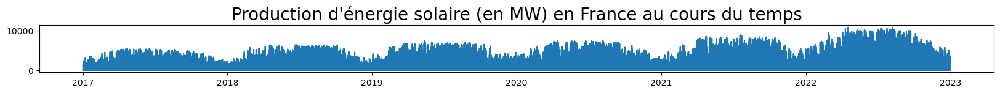

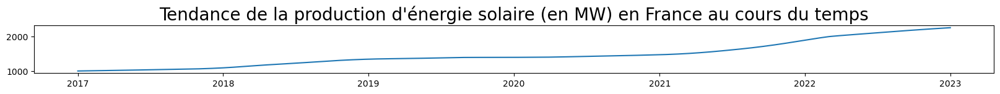

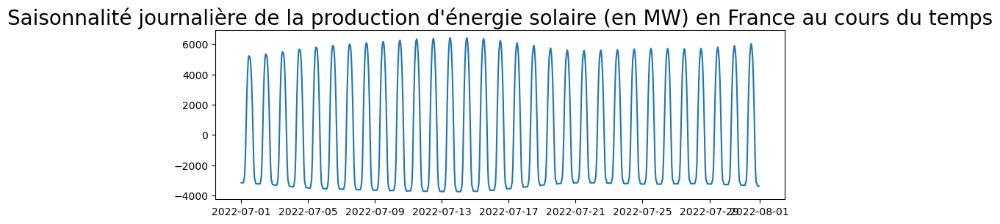

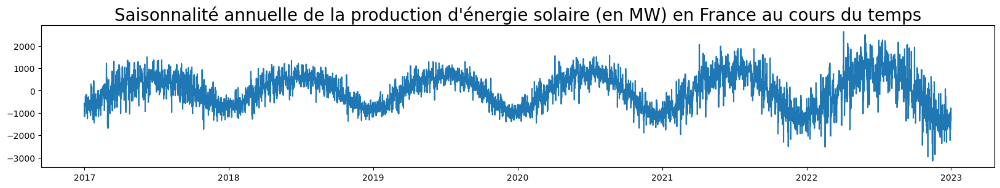

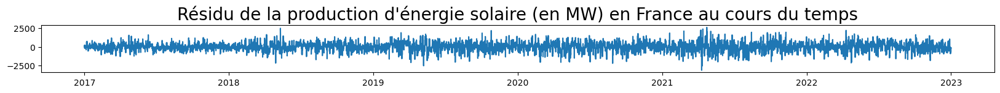

In [ ]:
plt.figure(figsize=(20,1))
plt.plot(solaire_bc)
plt.title('Production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,1))
plt.plot(res_sol_bc.trend)
plt.title('Tendance de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(10,3))
plt.plot(res_sol_bc.seasonal.seasonal_24)
plt.title('Saisonnalité journalière de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(10,3))
plt.plot(res_sol_bc.seasonal.seasonal_24.loc['2022-07'])
plt.title('Saisonnalité journalière de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,3))
plt.plot(res_sol_bc.seasonal.seasonal_8760)
plt.title('Saisonnalité annuelle de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)
plt.figure(figsize=(20,1))
plt.plot(res_sol_bc.resid)
plt.title('Résidu de la production d\'énergie solaire (en MW) en France au cours du temps', fontsize=20)

3. 2. 2. Hydraulique

<AxesSubplot:>

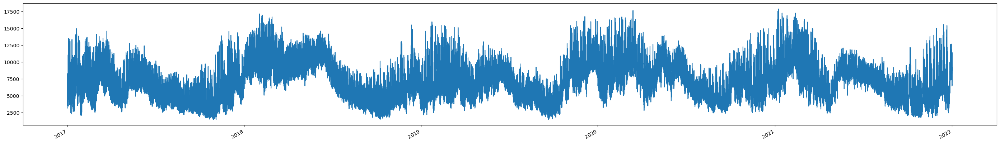

In [44]:
hydraulique.loc['2017-01-01':'2022-01-01'].plot(figsize=(35,5))

<AxesSubplot:>

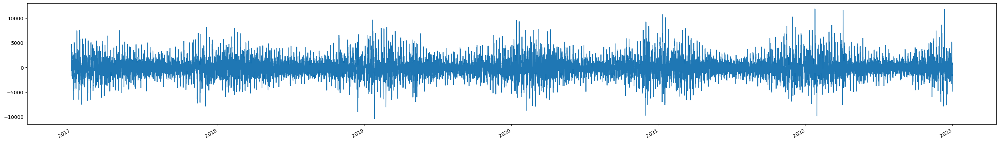

In [63]:
hydraulique.diff(24).plot(figsize=(35,5))

<AxesSubplot:>

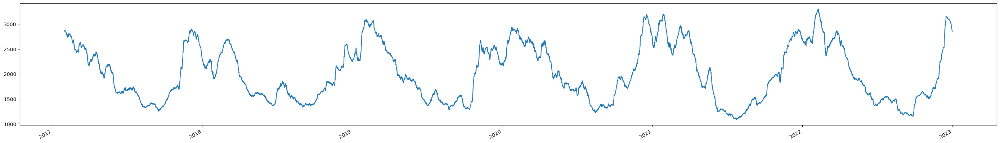

In [64]:
hydraulique.rolling(30*24).std().plot(figsize=(35,5))

In [65]:
model_hyd = MSTL(hydraulique, periods=(24, 24*365))
res_hyd = model_hyd.fit()
resid_hyd = res_hyd.resid

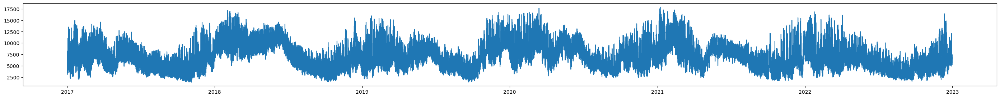

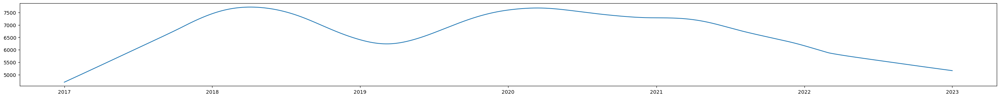

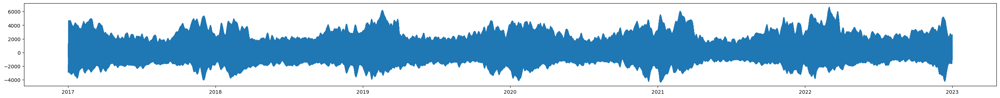

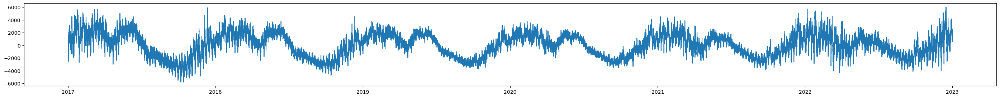

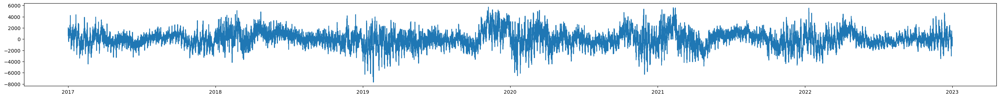

In [66]:
plt.figure(figsize=(35,3))
plt.plot(hydraulique)
plt.figure(figsize=(35,3))
plt.plot(res_hyd.trend)
plt.figure(figsize=(35,3))
plt.plot(res_hyd.seasonal.seasonal_24)
plt.figure(figsize=(35,3))
plt.plot(res_hyd.seasonal.seasonal_8760)
plt.figure(figsize=(35,3))
plt.plot(res_hyd.resid)

3. 2. 3. Eolien 

<AxesSubplot:>

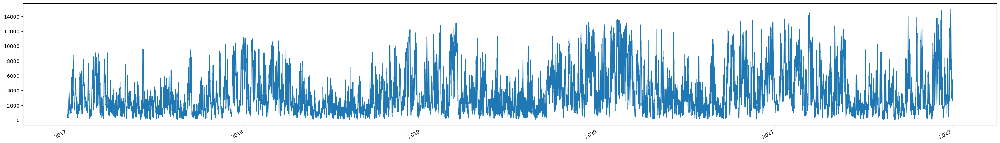

In [46]:
eolien.loc['2017-01-01':'2022-01-01'].plot(figsize=(35,5))

<AxesSubplot:>

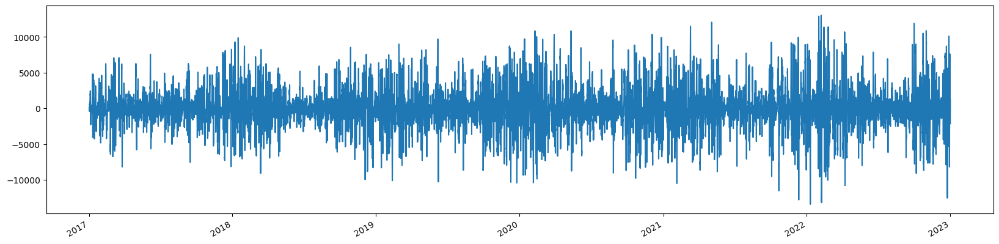

In [62]:
eolien.diff(24).plot(figsize=(20,5))

<AxesSubplot:>

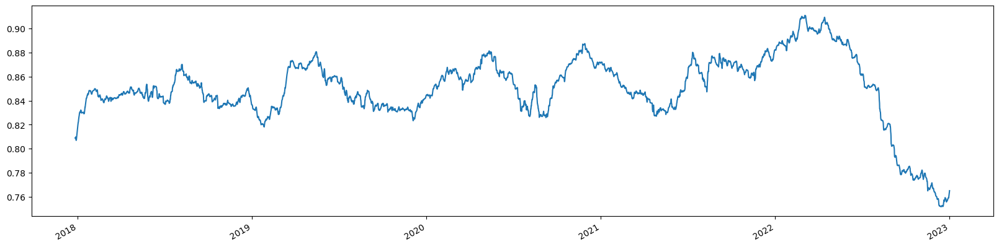

In [84]:
np.log(eolien).rolling(24*30*12).std().plot(figsize=(20,5))

<AxesSubplot:>

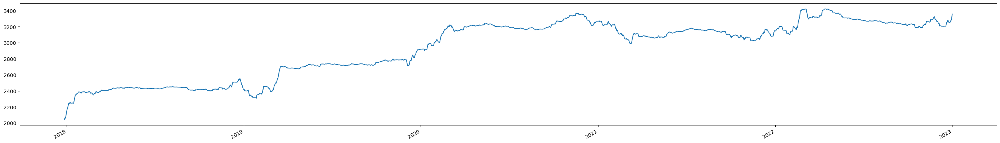

In [85]:
eolien.rolling(30*24*12).std().plot(figsize=(35,5))

<AxesSubplot:>

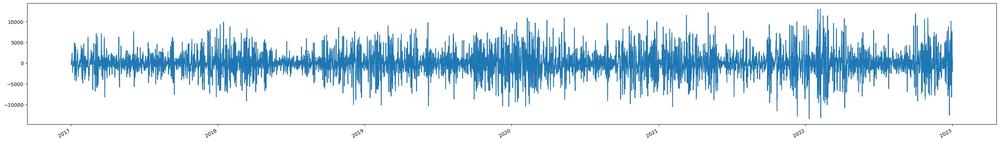

In [49]:
eolien.diff(24).plot(figsize=(35,5))

In [ ]:
model_sol = MSTL(solaire, periods=(24, 24*365))
res_sol = model_sol.fit()
resid_sol = res_sol.resid

In [ ]:
plt.figure(figsize=(35,3))
plt.plot(solaire)
plt.figure(figsize=(35,3))
plt.plot(res_sol.trend)
plt.figure(figsize=(35,3))
plt.plot(res_sol.seasonal.seasonal_24)
plt.figure(figsize=(35,3))
plt.plot(res_sol.seasonal.seasonal_8760)
plt.figure(figsize=(35,3))
plt.plot(res_sol.resid)

In [267]:
# On peut tester des sommes de différence de prix et de production d'énergies renouvelables sur des fenêtres de 24h
price_dif_day = price_dif\
    .groupby(price_dif.index.date).sum()

price_day = price\
    .groupby(price.index.date).sum()
price_day_st = (price_day - price_day.mean()) / price_day.std()

renew_dif_day = deseasonned_renew\
    .groupby(deseasonned_renew.index.date).sum()

renew_day = renouvelables\
    .groupby(renouvelables.index.date).sum()
renew_day_st = (renew_day - renew_day.mean()) / renew_day.std()

solaire_day = solaire\
    .groupby(solaire.index.date).sum()
sol_day_st = (solaire_day - solaire_day.mean()) / solaire_day.std()

eol_day = eolien\
    .groupby(eolien.index.date).sum()
eol_day_st = (eol_day - eol_day.mean()) / eol_day.std()

hydro_day = hydraulique\
    .groupby(hydraulique.index.date).sum()
hydro_day_st = (hydro_day - hydro_day.mean()) / hydro_day.std()



In [268]:
#test renouvelables ensemble
lag = 24*3
X = np.array(renew_day_st)[:-lag]
print(X.shape)
y = np.array(price_day_st)[lag:]
print(y.shape)

model = OLS(y, X)
results = model.fit()
print(results.summary())


(2119,)
(2119,)
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.007
Model:                            OLS   Adj. R-squared (uncentered):              0.006
Method:                 Least Squares   F-statistic:                              14.66
Date:                Mon, 17 Apr 2023   Prob (F-statistic):                    0.000133
Time:                        16:30:25   Log-Likelihood:                         -3030.0
No. Observations:                2119   AIC:                                      6062.
Df Residuals:                    2118   BIC:                                      6068.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------

/var/folders/h9/3f0fc1qs2t3943x127_ynxmc0000gn/T/ipykernel_37012/2881082714.py:2: RuntimeWarning: invalid value encountered in log
  plt.scatter(X,np.log(y))


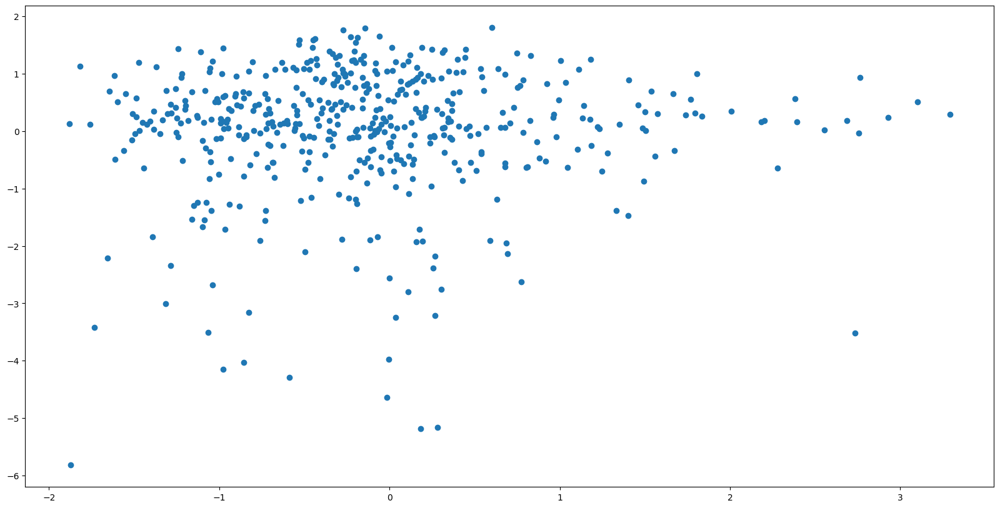

In [269]:
plt.figure(figsize=(20,10))
plt.scatter(X,np.log(y))

In [76]:
# return coef of results
results.t

AttributeError: 'OLSResults' object has no attribute 't'

Energie Hydraulique 

On remarque une saisonnalité journalière et tous les 26 jours environ


<Axes: >

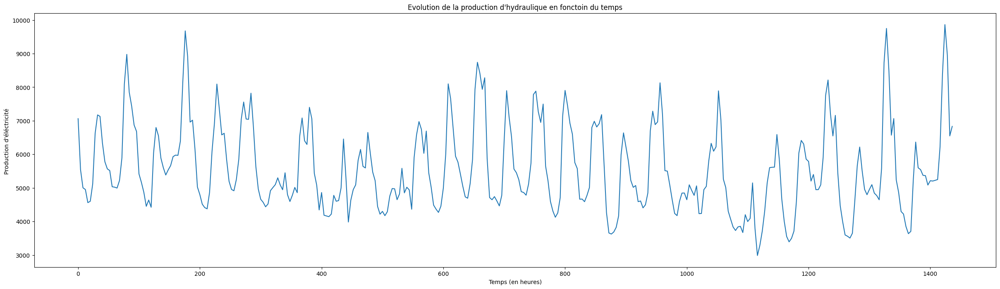

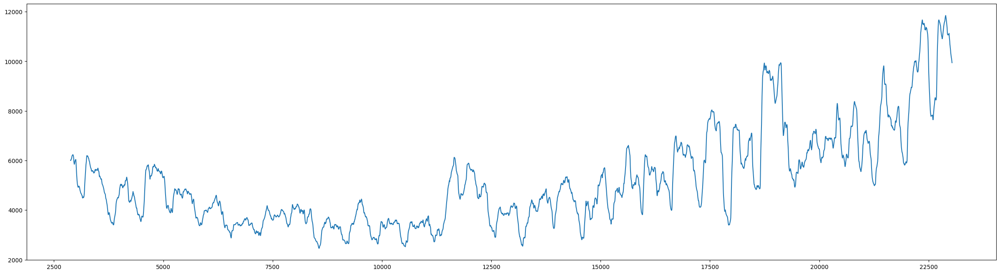

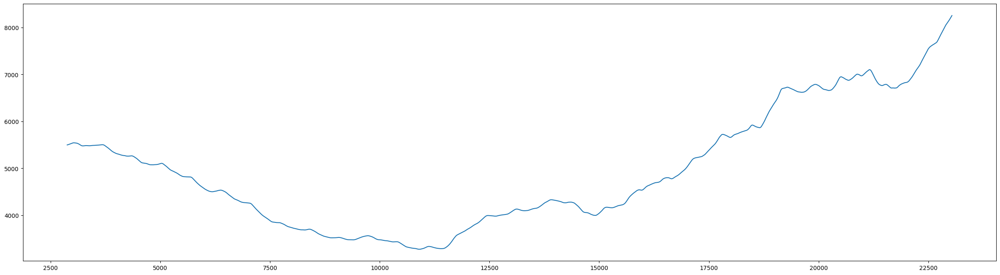

In [ ]:
plt.figure(figsize=(30, 8))
(df_mix_ec.dropna().iloc[::2]['Hydraulique - Fil de l?eau + ÈclusÈe'] +df_mix_ec.dropna().iloc[::2]['Hydraulique - Lacs']+df_mix_ec.dropna().iloc[::2]['Hydraulique - STEP turbinage']).iloc[:24*15].plot()
plt.title("Evolution de la production d'hydraulique en fonctoin du temps")
plt.xlabel("Temps (en heures)")
plt.ylabel("Production d'éléctricité ")
plt.figure(figsize=(30, 8))
(df_mix_ec.dropna().iloc[::2]['Hydraulique - Fil de l?eau + ÈclusÈe'] +df_mix_ec.dropna().iloc[::2]['Hydraulique - Lacs']+df_mix_ec.dropna().iloc[::2]['Hydraulique - STEP turbinage']).rolling(24).mean().iloc[24*30*1:24*30*8].plot()
print("On remarque une saisonnalité journalière et tous les 26 jours environ")
plt.figure(figsize=(30, 8))
(df_mix_ec.dropna().iloc[::2]['Hydraulique - Fil de l?eau + ÈclusÈe'] +df_mix_ec.dropna().iloc[::2]['Hydraulique - Lacs']+df_mix_ec.dropna().iloc[::2]['Hydraulique - STEP turbinage']).rolling(24).mean().rolling(24*26).mean().iloc[24*30*1:24*30*8].plot()


# **Analyse des commodités**

Text(0.5, 1.0, 'Variance glissante (30 jours) du prix du gaz au cours du temps')

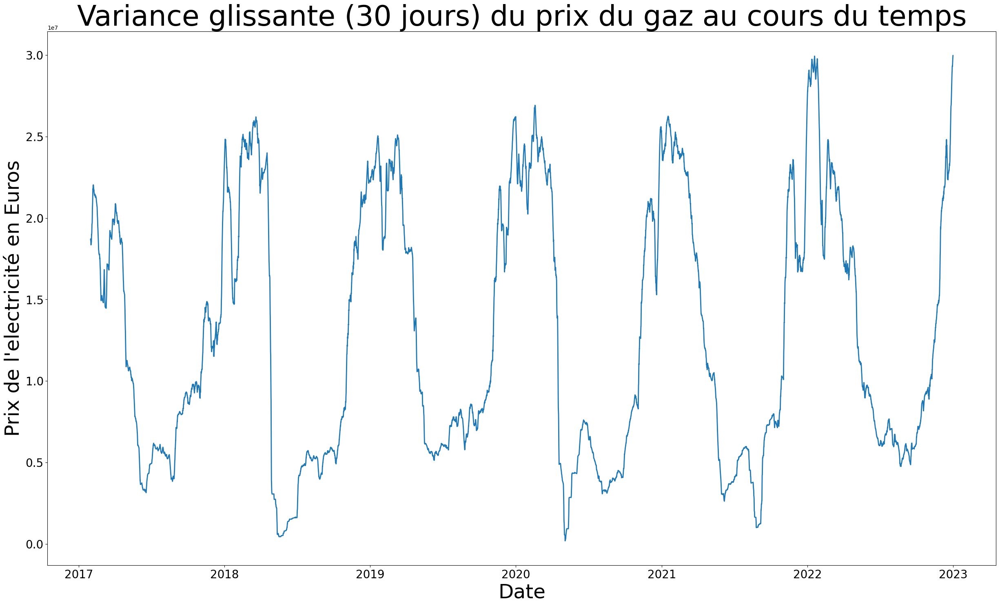

In [84]:
plt.figure(figsize=(30,17))


# add a treshold that the serie df_price can not overcome (to avoid outliers)
#treshold = 1000
#charbon = charbon.apply(lambda x: x if x < treshold else treshold)



plt.plot(np.square(gaz).rolling(24*30).std(), label='Variance glissante', linewidth=2)

plt.xlabel('Date', fontsize=35)
plt.ylabel('Prix de l\'electricité en Euros', fontsize=35)
#plt.axvline(x=pd.to_datetime('2021-09-20'), color='r', linestyle='--', linewidth=5)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.title('Variance glissante (30 jours) du prix du gaz au cours du temps', fontsize=50)



In [14]:
model_gaz = MSTL(gaz, periods=(24*365))
res_gaz = model_gaz.fit()
resid_gaz = res_gaz.resid

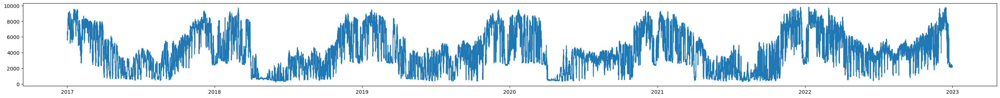

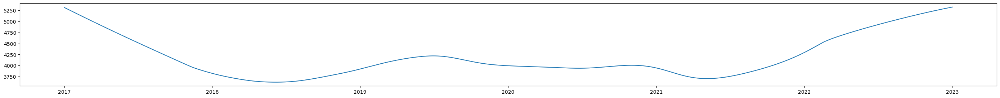

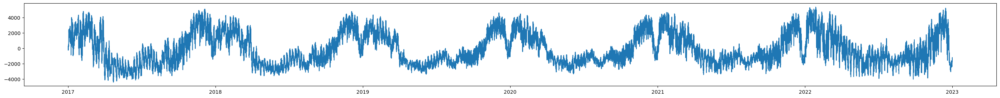

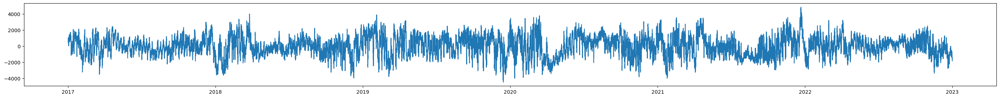

In [15]:
plt.figure(figsize=(35,3))
plt.plot(gaz)
plt.figure(figsize=(35,3))
plt.plot(res_gaz.trend)
plt.figure(figsize=(35,3))
plt.plot(res_gaz.seasonal)
#plt.figure(figsize=(35,3))
#plt.plot(res_gaz.seasonal.seasonal_8760)
plt.figure(figsize=(35,3))
plt.plot(res_gaz.resid)

<AxesSubplot:>

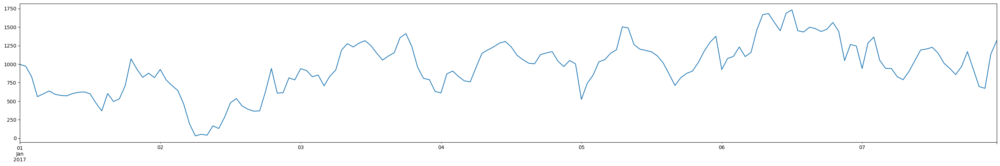

In [21]:
resid_gaz.iloc[0:24*7].plot(figsize=(35,5))

In [25]:
model_gaz_2 = MSTL(resid_gaz, periods=(24, 24*7))
res_gaz_2 = model_gaz_2.fit()
resid_gaz_2 = res_gaz_2.resid

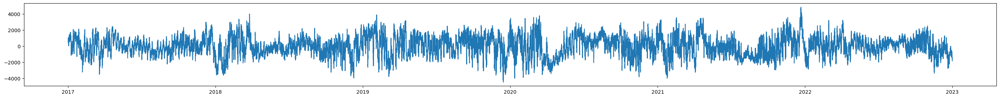

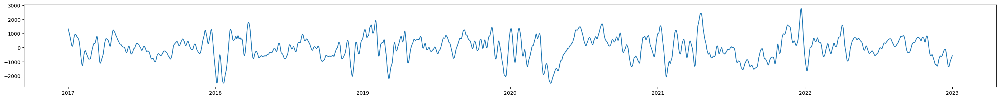

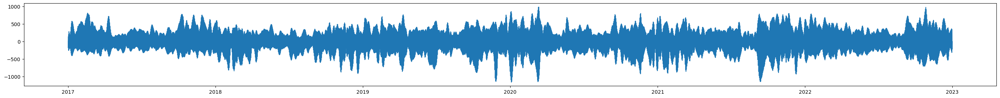

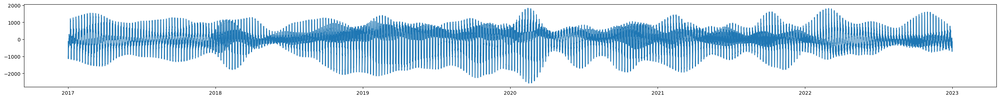

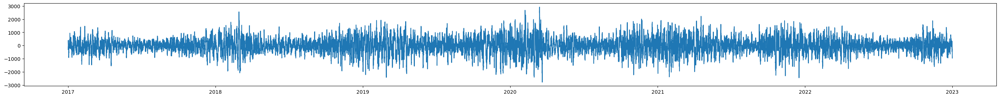

In [28]:
plt.figure(figsize=(35,3))
plt.plot(resid_gaz)
plt.figure(figsize=(35,3))
plt.plot(res_gaz_2.trend)
plt.figure(figsize=(35,3))
plt.plot(res_gaz_2.seasonal.seasonal_24)
plt.figure(figsize=(35,3))
plt.plot(res_gaz_2.seasonal.seasonal_168)
plt.figure(figsize=(35,3))
plt.plot(res_gaz_2.resid)

In [29]:
print('Utiliser Pedroni panel cointegration test ')

Utiliser Pedroni panel cointegration test 


# **Analyse des echanges entre pays**

Text(0.5, 1.0, 'Variance glissante (30 jours) des échanges France / Allemagne-Belgique')

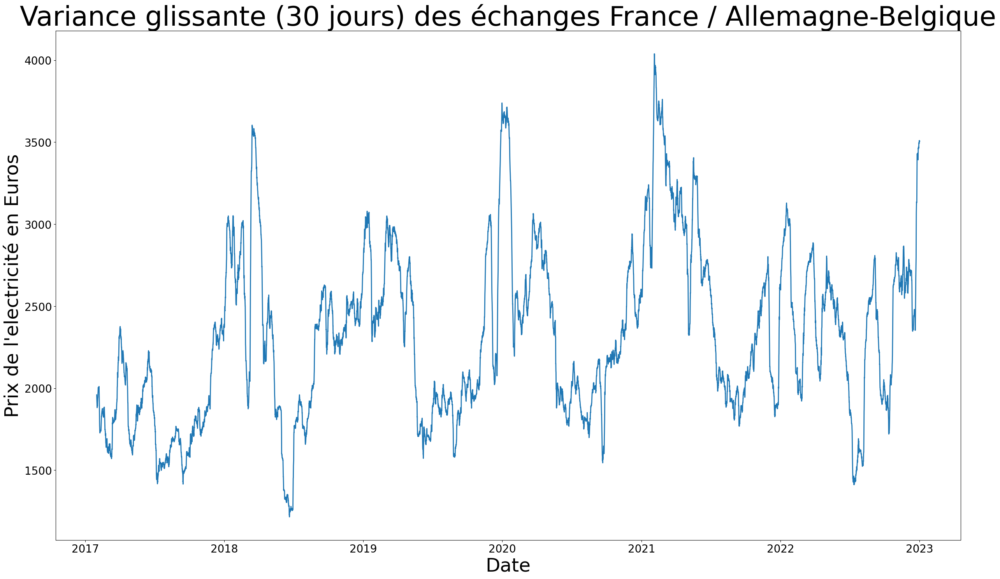

In [56]:
plt.figure(figsize=(30,17))

plt.plot(ex_ger.rolling(24*30).std(), label='Variance glissante', linewidth=2)

plt.xlabel('Date', fontsize=35)
plt.ylabel('Prix de l\'electricité en Euros', fontsize=35)
#plt.axvline(x=pd.to_datetime('2021-09-20'), color='r', linestyle='--', linewidth=5)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.title('Variance glissante (30 jours) des échanges France / Allemagne-Belgique', fontsize=50)

<AxesSubplot:>

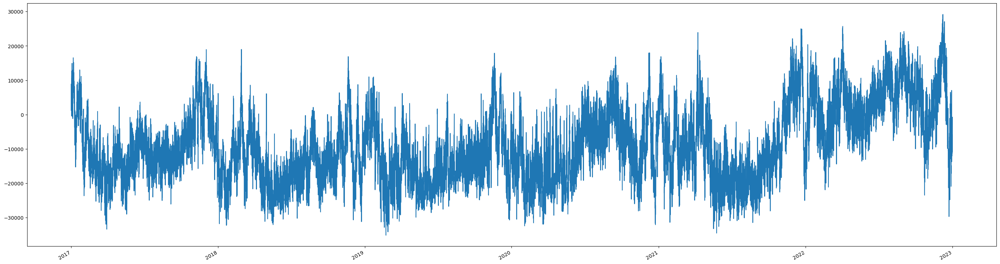

In [271]:
plt.figure(figsize=(35,10))
ex_sum.plot()

<AxesSubplot:ylabel='Density'>

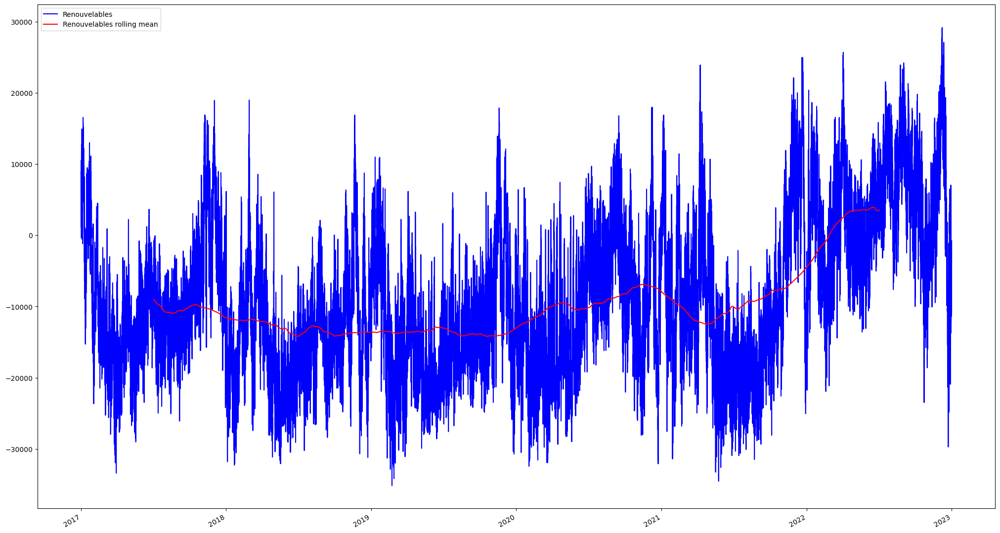

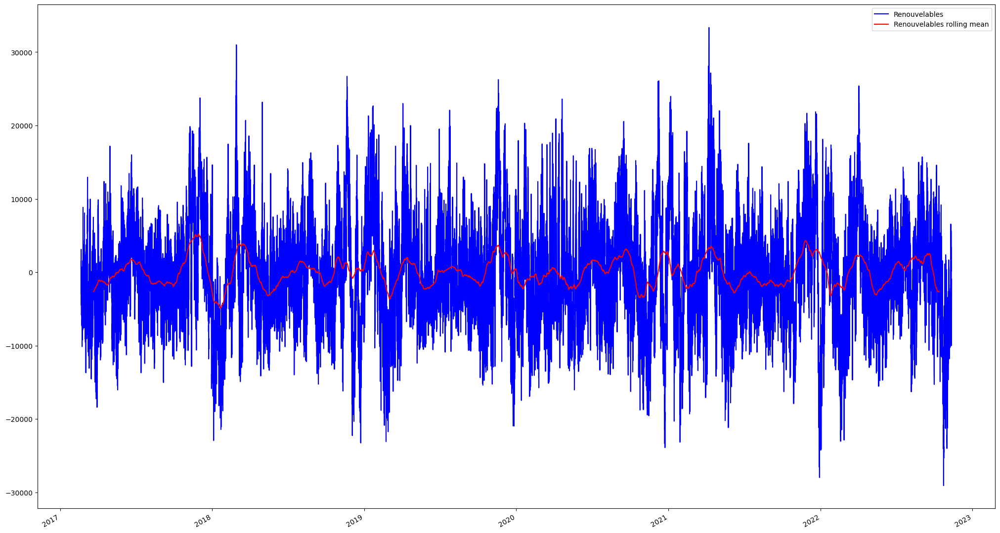

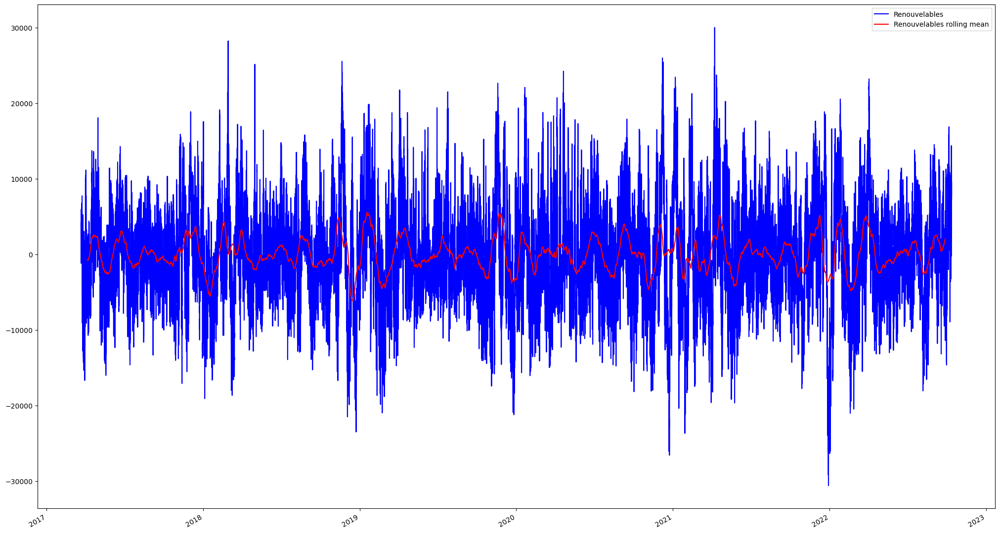

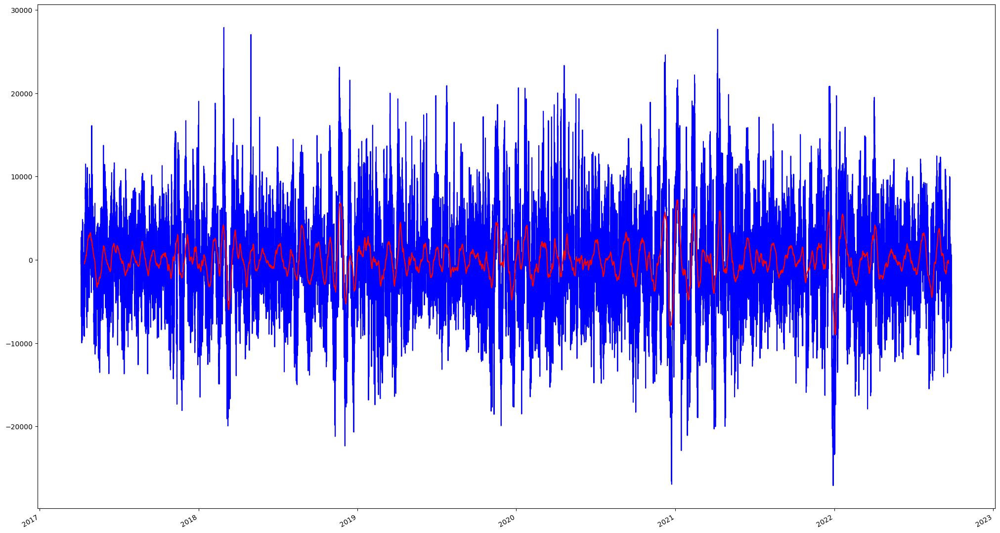

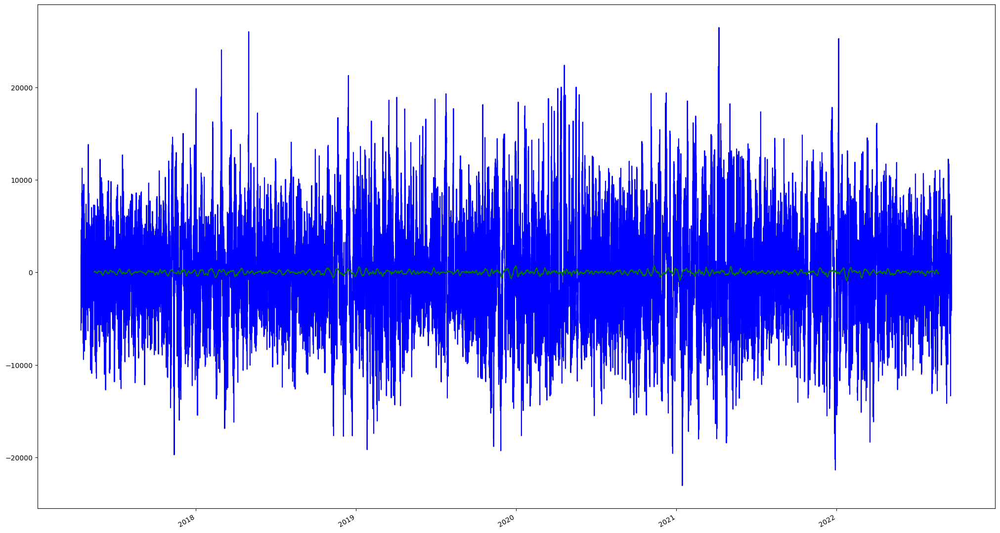

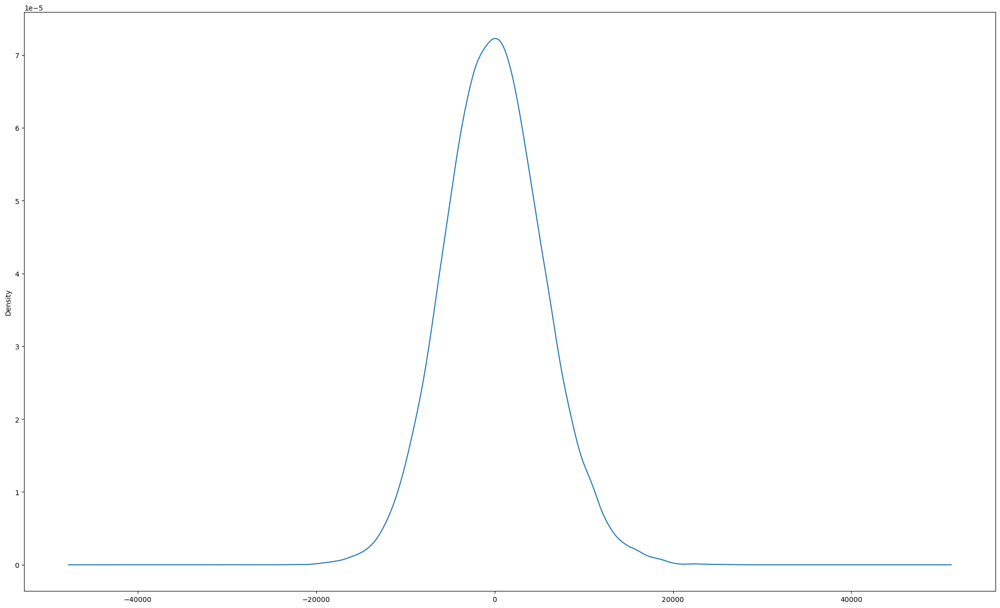

In [33]:
# Décompositoin de la série temporelle à la main

plt.figure(figsize=(25,15))
ex_sum.plot(color='blue')
ex_sum.rolling(24*365).mean().shift(-24*182).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_ex = ex_sum - ex_sum.rolling(24*100).mean().shift(-24*50)
mean_remove_ex.plot(color='blue')
mean_remove_ex.rolling(24*60).mean().shift(-24*30).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_ex_2 = mean_remove_ex - mean_remove_ex.rolling(24*60).mean().shift(-24*30)
mean_remove_ex_2.plot(color='blue')
mean_remove_ex_2.rolling(24*30).mean().shift(-24*15).plot(color='red')
plt.legend(['Renouvelables', 'Renouvelables rolling mean'])

plt.figure(figsize=(25,15))
mean_remove_ex_3 = mean_remove_ex_2 - mean_remove_ex_2.rolling(24*30).mean().shift(-24*15)
mean_remove_ex_3.plot(color='blue')
mean_remove_ex_3.rolling(24*15).mean().shift(-24*7).plot(color='red')

plt.figure(figsize=(25,15))
mean_remove_ex_4 = mean_remove_ex_3 - mean_remove_ex_3.rolling(24*15).mean().shift(-24*7)
mean_remove_ex_4.plot(color='blue')
#mean_remove_ex_4.loc['2017':'2020'].rolling(24*7).mean().shift(-24*3).plot(color='red')
mean_remove_ex_4.rolling(24*60).mean().shift(-24*30).plot(color='green')


plt.figure(figsize=(25,15))
mean_remove_ex_4.plot(kind = 'kde')

Décomposition de saisonnalité multiple avec statsmodels

In [296]:
from statsmodels.tsa.seasonal import MSTL
# Décomposition avec multi-saisonnalité

model_ex = MSTL(ex_sum, periods=(24, 24*365))
res_ex = model_ex.fit()
resid_ex = res_ex.resid

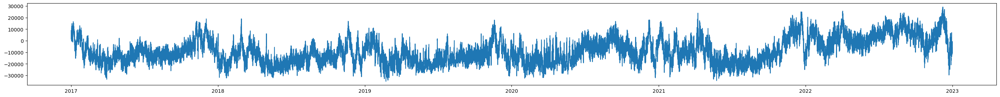

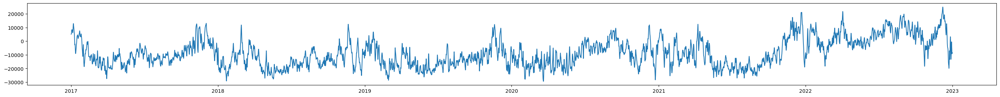

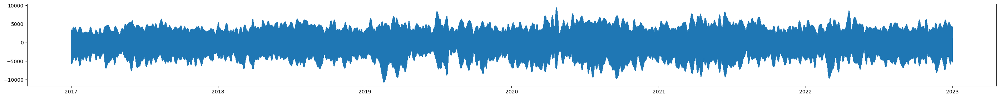

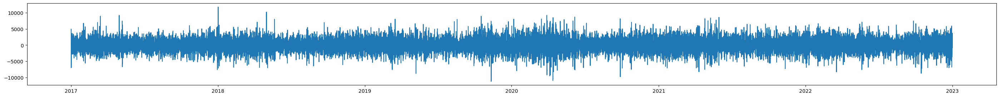

In [294]:
plt.figure(figsize=(35,3))
plt.plot(ex_sum)
plt.figure(figsize=(35,3))
plt.plot(res_ex.trend)
plt.figure(figsize=(35,3))
plt.plot(res_ex.seasonal)#.seasonal_24)
#plt.figure(figsize=(35,1))
#plt.plot(res_ex.seasonal.seasonal_8760)
plt.figure(figsize=(35,3))
plt.plot(res_ex.resid)

Text(0.5, 1.0, 'Distribution de probabilité du résidu')

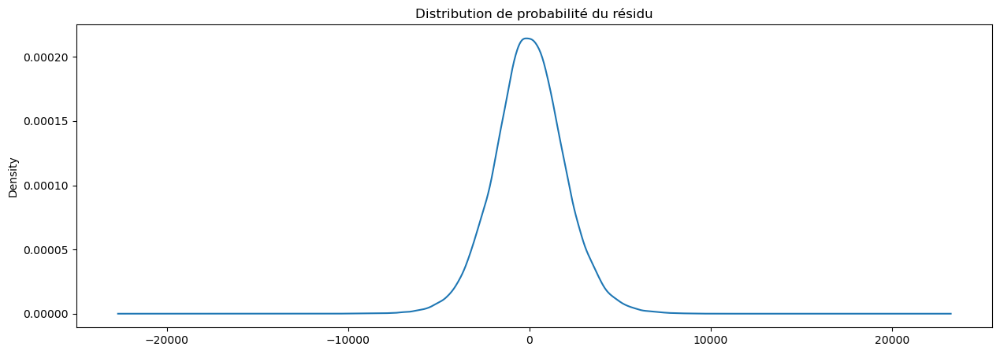

In [282]:
plt.figure(figsize=(15,5))
res_ex.resid.plot(kind='kde')
plt.title('Distribution de probabilité du résidu')

Text(0.5, 1.0, 'Standard deviation of the energy external exchange')

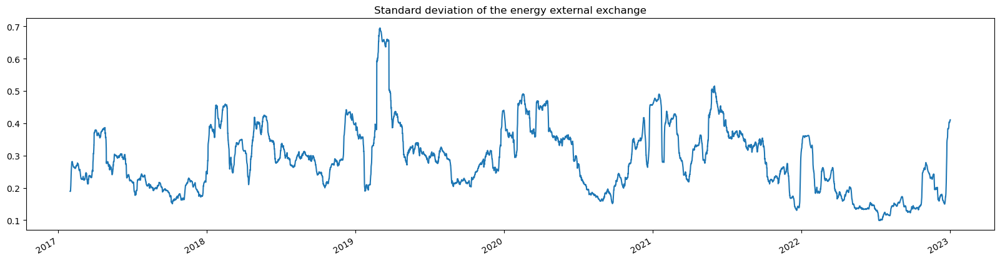

In [78]:
np.log(ex_sum+abs(ex_sum.min())+1).rolling(24*30).std().plot(figsize=(20,5))
plt.title('Standard deviation of the energy external exchange')

<class 'pandas.core.series.Series'>
Pour le prix: 
ADF Statistic: -16.289063
p-value: 0.000000
Used Lag: 58.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


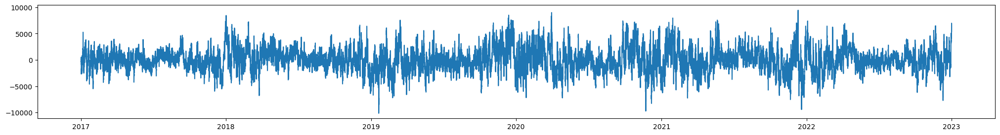

In [ ]:
window = 24
deseasonned_renew = resid.dropna()# - renouvelables.shift(24)).dropna()
print(type(deseasonned_renew))
plt.figure(figsize=(25,3))
plt.plot(deseasonned_renew)
stat_test, p_value, usedlag, nobs, critical_values, icbest = adfuller(deseasonned_renew)
print('Pour le prix: ')
print('ADF Statistic: %f' % stat_test)
print('p-value: %f' % p_value)
print('Used Lag: %f' % usedlag)
print('Critical Values:')
for key, value in critical_values.items():
    print('\t%s: %.3f' % (key, value))

In [ ]:
# create ARIMA model with exogenous variables
model = ARIMA(df_all['Price'], order=(72, 3, 10), exog=df_all[['Solaire', 'Eolien', 'Hydraulique']])
model_fit = model.fit()
print(model_fit.summary())

# make prediction
yhat = model_fit.predict(len(df_all), len(df_all), exog=df_all[['Solaire', 'Eolien', 'Hydraulique']])
print(yhat)


Il faut maintenant décider comment nous allons utiliser les donées d'énergie renouvelables

1. Essayons comme la publi : pour chaque heure d'une journée que l'on veut prédire, on prend toutes les valeurs de génération d'énergie renouvelable à d-1, d-3 et d-7 (3*24 valeurs), peut-être peut-on utiliser les prédictions de météo (soleil et vent)

In [16]:
df_all

,Price,Renouvelables,Solaire,Eolien,Hydraulique
2022-05-31 22:00:00,220.00,8949.0,0.0,1887.0,7062.0
2022-05-31 23:00:00,207.45,7441.0,0.0,1899.0,5542.0
2022-06-01 00:00:00,199.09,6896.0,0.0,1894.0,5002.0
2022-06-01 01:00:00,182.53,6876.0,0.0,1926.0,4950.0
2022-06-01 02:00:00,182.28,6342.0,0.0,1782.0,4560.0
...,...,...,...,...,...
2022-12-31 19:00:00,7.60,22097.0,0.0,15597.0,6500.0
2022-12-31 20:00:00,3.69,21935.0,0.0,15271.0,6664.0
2022-12-31 21:00:00,1.88,21898.0,0.0,14987.0,6911.0
2022-12-31 22:00:00,0.10,21165.0,0.0,14620.0,6545.0


In [17]:
df_all['Features_solaire']= df_all['Solaire'].shift(1) 

2022-05-31 22:00:00    NaN
2022-05-31 23:00:00    0.0
2022-06-01 00:00:00    0.0
2022-06-01 01:00:00    0.0
2022-06-01 02:00:00    0.0
                      ... 
2022-12-31 19:00:00    0.0
2022-12-31 20:00:00    0.0
2022-12-31 21:00:00    0.0
2022-12-31 22:00:00    0.0
2022-12-31 23:00:00    0.0
Name: Solaire, Length: 5138, dtype: float64

In [29]:
from statsmodels.tsa.arima.model import ARIMA
 
model = ARIMA(price_ar, order=(5,1,5))
results = model.fit()
results.summary()

/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/dorianfitton/opt/anaconda3/envs/bgd/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 5138
Model:                 ARIMA(5, 1, 5)   Log Likelihood              -25375.032
Date:                Thu, 30 Mar 2023   AIC                          50772.064
Time:                        14:57:46   BIC                          50844.050
Sample:                             0   HQIC                         50797.259
                               - 5138                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2272      0.652      0.348      0.728      -1.051       1.505
ar.L2          0.4162      0.081      5.151      0.000       0.258       0.575
ar.L3          0.4565      0.294      1.555      0.120      -0.119       1.032
ar.L4         -0.7246      0.337     -2.148      0.032      -1.386      -0.063
ar.L5          0.0950      0.436      0.218      0.828      -0.760       0.950
ma.L1         -0.0318      0.651     -0.049      0.961      -1.309       1.245
ma.L2         -0.4431      0.059     -7.510      0.000      -0.559      -0.327
ma.L3         -0.6696      0.303     -2.210      0.027      -1.263      -0.076
ma.L4          0.4415      0.479      0.922      0.356      -0.497       1.380
ma.L5         -0.0765      0.240     -0.318      0.750      -0.547       0.394
sigma2      1140.4225     12.066     94.517      0.000    1116.774    1164.071
===================================================================================
Ljung-Box (L1) (Q):                   0.80   Jarque-Bera (JB):             11159.90
Prob(Q):                              0.37   Prob(JB):                         0.00
Heteroskedasticity (H):               0.52   Skew:                            -0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""